# 03 Strict Validation And Test Model Comparison

This notebook loads strict protocol artifacts from separate training notebooks: table models from `02_table_model_forecasting.ipynb`, per-ticker LSTM from `02b_lstm_forecasting.ipynb`, and optional global LSTM from `02c_global_lstm_forecasting.ipynb`. Validation metrics are used for model-selection diagnostics, while test metrics remain out-of-sample evaluation.


In [1]:
from pathlib import Path
import sys

cwd = Path.cwd().resolve()
for candidate in [cwd, cwd / "forecasting", cwd.parent, cwd.parent / "forecasting"]:
    if (candidate / "src" / "stock_forecast").exists():
        PROJECT_DIR = candidate
        break
else:
    raise RuntimeError("Cannot locate forecasting project directory with src/stock_forecast")

SRC_DIR = PROJECT_DIR / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

ARTIFACT_DIR = PROJECT_DIR / "artifacts"
DATA_DIR = ARTIFACT_DIR / "data"
REPORTS_DIR = ARTIFACT_DIR / "reports"
PLOTS_DIR = ARTIFACT_DIR / "plots"
for path in [DATA_DIR, REPORTS_DIR, PLOTS_DIR]:
    path.mkdir(parents=True, exist_ok=True)

print(f"PROJECT_DIR = {PROJECT_DIR}")

PROJECT_DIR = /home/sapce/forecasting_stock_prices/forecasting


In [2]:
from pathlib import Path
import json
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

from stock_forecast.artifacts import load_json, load_table, save_json, save_table
from stock_forecast.backtest import run_seeded_panel_signal_backtest, run_test_signal_backtest

pd.set_option("display.max_columns", 160)
plt.style.use("default")


## Notebook Constants

In [3]:
PRIMARY_METRIC = "directional_accuracy"
HORIZONS = [
    {"name": "week", "horizon": 5},
    {"name": "month", "horizon": 21},
]
MAX_TICKER_PLOTS = None
SCATTER_SAMPLE = 5000
PROFIT_INITIAL_CAPITAL = 100_000.0
SMAPE_EPSILON = 1e-12
PREDICTION_METRIC_COLS = ["mae", "mse", "rmse", "smape", "r2", "pearson", "spearman", "directional_accuracy"]
SIGNAL_METRIC_COLS = ["cumulative_return", "annualized_return", "annualized_volatility", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades", "n_rebalances"]
SIGNAL_COMPARISON_COLS = ["cumulative_return", "annualized_return", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades"]
VALIDATION_BAR_METRIC_COLS = ["sharpe", "sortino", "calmar", "cumulative_return", "max_drawdown", "turnover", "number_of_trades"]
HEADLINE_SIGNAL_MODE = "overlapping_tranches"
TRANSACTION_COST_BPS = 10.0
SLIPPAGE_BPS = 5.0
LONG_THRESHOLD = 0.0
SIGNAL_ANCHOR = "expanding_median"
TABLE_COMPARISON_SOURCE = "table"
LSTM_ONLY_ARTIFACT_NAME = "lstm_only"
GLOBAL_LSTM_ARTIFACT_NAME = "global_lstm"
GLOBAL_MAMBA_ARTIFACT_NAME = "global_mamba"
REPORT_MODEL_NAMES = ["lstm_all", "lstm", "ridge", "mamba_all"]
REPORT_MODEL_NAME_SET = set(REPORT_MODEL_NAMES)
MODEL_NAME_ALIASES = {
    "global_lstm_all": "lstm_all",
    "global_mamba_all": "mamba_all",
}


## Load Separate Strict Test Artifacts


In [4]:
def progress(message: str) -> None:
    print(message, flush=True)


progress("Preparing strict comparison artifact loaders...")


def table_exists(path: Path) -> bool:
    return path.exists() or path.with_suffix(".csv").exists()


def safe_filename(value: str) -> str:
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(value)).strip("._") or "ticker"


def add_comparison_source(frame: pd.DataFrame, source: str) -> pd.DataFrame:
    out = frame.copy()
    if not out.empty:
        out["comparison_source"] = source
    return out


def concat_metric_frames(frames: list[pd.DataFrame]) -> pd.DataFrame:
    clean = [frame for frame in frames if frame is not None and not frame.empty]
    return pd.concat(clean, ignore_index=True, sort=False) if clean else pd.DataFrame()


def normalize_date_columns(frame: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    for col in ["date", "signal_date", "entry_date", "target_date", "train_start", "train_end"]:
        if col in out.columns:
            out[col] = pd.to_datetime(out[col])
    return out


def compute_prediction_error_metrics(predictions: pd.DataFrame) -> pd.DataFrame:
    required_cols = {"y_true", "y_pred"}
    if predictions.empty or not required_cols.issubset(predictions.columns):
        return pd.DataFrame()
    group_cols = [col for col in ["split_role", "ticker", "model_name", "comparison_source"] if col in predictions.columns]
    if not group_cols:
        return pd.DataFrame()

    rows = []
    for group_key, group in predictions.groupby(group_cols, dropna=False):
        key_values = group_key if isinstance(group_key, tuple) else (group_key,)
        row = dict(zip(group_cols, key_values))
        valid = group[["y_true", "y_pred"]].replace([np.inf, -np.inf], np.nan).dropna()
        if valid.empty:
            row.update({"mse": float("nan"), "smape": float("nan")})
        else:
            y_true = valid["y_true"].astype(float).to_numpy()
            y_pred = valid["y_pred"].astype(float).to_numpy()
            error = y_pred - y_true
            denominator = np.abs(y_true) + np.abs(y_pred)
            smape_terms = np.divide(2.0 * np.abs(error), denominator, out=np.zeros_like(error, dtype=float), where=denominator > SMAPE_EPSILON)
            row.update({"mse": float(np.mean(error ** 2)), "smape": float(np.mean(smape_terms) * 100.0)})
        rows.append(row)
    return pd.DataFrame(rows)


def ensure_prediction_error_metrics(metrics: pd.DataFrame, predictions: pd.DataFrame) -> pd.DataFrame:
    out = metrics.copy()
    metric_cols = ["mse", "smape"]
    computed = compute_prediction_error_metrics(predictions)
    if computed.empty:
        for col in metric_cols:
            if col not in out.columns:
                out[col] = np.nan
        return out

    merge_cols = [col for col in ["split_role", "ticker", "model_name", "comparison_source"] if col in out.columns and col in computed.columns]
    if not merge_cols:
        return out

    add_cols = [col for col in metric_cols if col not in out.columns]
    fill_cols = [col for col in metric_cols if col in out.columns]
    if add_cols:
        out = out.merge(computed[merge_cols + add_cols], on=merge_cols, how="left")
    if fill_cols:
        fill_values = computed[merge_cols + fill_cols].rename(columns={col: f"{col}_computed" for col in fill_cols})
        out = out.merge(fill_values, on=merge_cols, how="left")
        for col in fill_cols:
            computed_col = f"{col}_computed"
            out[col] = out[col].where(out[col].notna(), out[computed_col])
            out = out.drop(columns=computed_col)
    return out


def load_optional_table(path: Path) -> pd.DataFrame:
    return load_table(path) if table_exists(path) else pd.DataFrame()


def report_model_name(value: object) -> object:
    if pd.isna(value):
        return value
    return MODEL_NAME_ALIASES.get(str(value), str(value))


def normalize_report_model_names(frame: pd.DataFrame) -> pd.DataFrame:
    if frame.empty or "model_name" not in frame.columns:
        return frame.copy()
    out = frame.copy()
    out["model_name"] = out["model_name"].map(report_model_name)
    return out


def keep_report_model_rows(frame: pd.DataFrame) -> pd.DataFrame:
    if frame.empty or "model_name" not in frame.columns:
        return frame.copy()
    return frame[frame["model_name"].map(report_model_name).isin(REPORT_MODEL_NAME_SET)].copy()


def filter_report_model_rows(frame: pd.DataFrame) -> pd.DataFrame:
    return keep_report_model_rows(normalize_report_model_names(frame))


def drop_model_rows(frame: pd.DataFrame, model_names: set[str]) -> pd.DataFrame:
    if frame.empty or "model_name" not in frame.columns:
        return frame.copy()
    return frame[~frame["model_name"].map(report_model_name).isin(model_names)].copy()


def best_params_with_source(rows: list[dict], source: str, drop_model_names: set[str] | None = None) -> list[dict]:
    drop_model_names = drop_model_names or set()
    out = []
    for row in rows:
        model_name = report_model_name(row.get("model_name"))
        if model_name in drop_model_names or model_name not in REPORT_MODEL_NAME_SET:
            continue
        item = dict(row)
        item["model_name"] = model_name
        item["comparison_source"] = source
        out.append(item)
    return out


PER_TICKER_REQUIRED_FILES = [
    "outer_splits.parquet",
    "validation_predictions.parquet",
    "test_predictions.parquet",
    "validation_model_ranking.parquet",
    "validation_prediction_metrics.parquet",
    "selected_models_by_ticker.parquet",
    "test_prediction_metrics.parquet",
    "test_signal_equity.parquet",
    "test_signal_metrics.parquet",
    "leakage_audit.parquet",
]
GLOBAL_REQUIRED_FILES = [
    "validation_predictions.parquet",
    "test_predictions.parquet",
    "validation_prediction_metrics.parquet",
    "test_prediction_metrics.parquet",
    "validation_signal_metrics.parquet",
    "test_signal_metrics.parquet",
    "validation_panel_signal_metrics.parquet",
    "test_panel_signal_metrics.parquet",
    "leakage_audit.parquet",
]
METRIC_DIRECTIONS = {
    "mae": "min",
    "mse": "min",
    "rmse": "min",
    "smape": "min",
    "r2": "max",
    "pearson": "max",
    "spearman": "max",
    "directional_accuracy": "max",
}


def load_per_ticker_artifacts(
    *,
    reports_dir: Path,
    source: str,
    missing_hint: str,
    drop_stale_lstm: bool = False,
) -> dict:
    progress(f"Loading {source} strict artifacts: {reports_dir.relative_to(PROJECT_DIR)}")
    missing = [name for name in PER_TICKER_REQUIRED_FILES if not table_exists(reports_dir / name)]
    if missing:
        raise FileNotFoundError(f"Missing {source} strict artifacts: {missing}. {missing_hint}")

    progress(f"Loading {source} report tables")
    out = {
        "reports_dir": reports_dir,
        "outer_splits": load_table(reports_dir / "outer_splits.parquet"),
        "validation_predictions": load_table(reports_dir / "validation_predictions.parquet"),
        "test_predictions": load_table(reports_dir / "test_predictions.parquet"),
        "validation_model_ranking": load_table(reports_dir / "validation_model_ranking.parquet"),
        "selected_models_by_ticker": load_table(reports_dir / "selected_models_by_ticker.parquet"),
        "validation_prediction_metrics": load_table(reports_dir / "validation_prediction_metrics.parquet"),
        "test_prediction_metrics": load_table(reports_dir / "test_prediction_metrics.parquet"),
        "test_signal_equity": load_table(reports_dir / "test_signal_equity.parquet"),
        "test_signal_metrics": load_table(reports_dir / "test_signal_metrics.parquet"),
        "leakage_audit": load_table(reports_dir / "leakage_audit.parquet"),
    }
    frame_names = [
        "validation_predictions",
        "test_predictions",
        "validation_model_ranking",
        "selected_models_by_ticker",
        "validation_prediction_metrics",
        "test_prediction_metrics",
        "test_signal_equity",
        "test_signal_metrics",
        "leakage_audit",
    ]
    drop_names = {"lstm"} if drop_stale_lstm else set()
    for frame_name in frame_names:
        frame = normalize_date_columns(out[frame_name])
        if drop_names:
            frame = drop_model_rows(frame, drop_names)
        frame = filter_report_model_rows(frame)
        out[frame_name] = add_comparison_source(frame, source)

    out["validation_prediction_metrics"] = ensure_prediction_error_metrics(out["validation_prediction_metrics"], out["validation_predictions"])
    out["test_prediction_metrics"] = ensure_prediction_error_metrics(out["test_prediction_metrics"], out["test_predictions"])

    best_param_rows = load_json(reports_dir / "best_params.json") if (reports_dir / "best_params.json").exists() else []
    out["best_params"] = best_params_with_source(best_param_rows, source, drop_model_names=drop_names)
    return out


def rank_per_ticker_models(validation_metrics: pd.DataFrame) -> pd.DataFrame:
    if validation_metrics.empty:
        return pd.DataFrame()
    if PRIMARY_METRIC not in validation_metrics.columns:
        raise ValueError(f"Missing primary metric column in validation metrics: {PRIMARY_METRIC}")
    ascending = METRIC_DIRECTIONS.get(PRIMARY_METRIC, "min") == "min"
    ranking = validation_metrics.copy()
    ranking = ranking.rename(columns={PRIMARY_METRIC: f"validation_{PRIMARY_METRIC}"})
    sort_cols = ["ticker", f"validation_{PRIMARY_METRIC}"]
    sort_ascending = [True, ascending]
    if PRIMARY_METRIC != "directional_accuracy" and "directional_accuracy" in ranking.columns:
        sort_cols.append("directional_accuracy")
        sort_ascending.append(False)
    if PRIMARY_METRIC != "rmse" and "rmse" in ranking.columns:
        sort_cols.append("rmse")
        sort_ascending.append(True)
    if "comparison_source" in ranking.columns:
        sort_cols.append("comparison_source")
        sort_ascending.append(True)
    sort_cols.append("model_name")
    sort_ascending.append(True)
    ranking = ranking.sort_values(sort_cols, ascending=sort_ascending)
    ranking["selection_scope"] = "per_ticker"
    ranking["validation_rank"] = ranking.groupby("ticker").cumcount() + 1
    ranking["is_validation_selected"] = ranking["validation_rank"].eq(1)
    return ranking


def enrich_test_metrics_with_ranking(test_metrics: pd.DataFrame, ranking: pd.DataFrame) -> pd.DataFrame:
    if test_metrics.empty or ranking.empty:
        return test_metrics.copy()
    out = test_metrics.copy()
    drop_cols = ["validation_rank", "is_validation_selected", f"validation_{PRIMARY_METRIC}"]
    out = out.drop(columns=[col for col in drop_cols if col in out.columns])
    merge_cols = ["ticker", "model_name"]
    if "comparison_source" in out.columns and "comparison_source" in ranking.columns:
        merge_cols.append("comparison_source")
    enrich_cols = [*merge_cols, "validation_rank", "is_validation_selected", f"validation_{PRIMARY_METRIC}"]
    enrich_cols = [col for col in enrich_cols if col in ranking.columns]
    return out.merge(ranking[enrich_cols], on=merge_cols, how="left")


def combine_per_ticker_sources(table_result: dict, lstm_result: dict) -> dict:
    combined = {}
    for key in [
        "validation_predictions",
        "test_predictions",
        "validation_prediction_metrics",
        "test_prediction_metrics",
        "test_signal_equity",
        "test_signal_metrics",
        "leakage_audit",
    ]:
        combined[key] = concat_metric_frames([table_result[key], lstm_result[key]])

    ranking = rank_per_ticker_models(combined["validation_prediction_metrics"])
    combined["validation_model_ranking"] = ranking
    combined["selected_models_by_ticker"] = ranking[ranking["is_validation_selected"].fillna(False).astype(bool)].copy()
    combined["test_prediction_metrics"] = enrich_test_metrics_with_ranking(combined["test_prediction_metrics"], ranking)
    combined["outer_splits"] = table_result["outer_splits"]
    combined["best_params"] = [*table_result.get("best_params", []), *lstm_result.get("best_params", [])]
    return combined


def global_ranking_by_ticker(global_result: dict, tickers: list[str], source: str = GLOBAL_LSTM_ARTIFACT_NAME) -> pd.DataFrame:
    ranking = global_result.get("validation_model_ranking", pd.DataFrame()).copy()
    if ranking.empty or not tickers:
        return pd.DataFrame()
    if {"long_threshold", "selected_threshold"}.issubset(ranking.columns):
        ranking = ranking[np.isclose(ranking["long_threshold"].astype(float), ranking["selected_threshold"].astype(float))]
    rank_cols = [col for col in ["profit_risk_utility", "panel_sharpe", "mean_ticker_sharpe", "model_name"] if col in ranking.columns]
    rank_ascending = [False, False, False, True][: len(rank_cols)]
    ranking = ranking.sort_values(rank_cols, ascending=rank_ascending).drop_duplicates("model_name", keep="first")
    if ranking.empty:
        return pd.DataFrame()
    ranking["validation_rank"] = np.arange(1, len(ranking) + 1)
    ranking["is_validation_selected"] = ranking["validation_rank"].eq(1)
    rows = []
    for ticker in tickers:
        part = ranking.copy()
        part["ticker"] = ticker
        part["selection_scope"] = "global_panel"
        rows.append(part)
    return add_comparison_source(pd.concat(rows, ignore_index=True, sort=False), source)


def load_global_sequence_artifacts(horizon_name: str, tickers: list[str], source: str, label: str) -> dict:
    reports_dir = ARTIFACT_DIR / "horizons" / horizon_name / source / "strict_protocol" / "reports"
    progress(f"Checking {label} artifacts for {horizon_name}: {reports_dir.relative_to(PROJECT_DIR)}")
    missing = [name for name in GLOBAL_REQUIRED_FILES if not table_exists(reports_dir / name)]
    if missing:
        print(f"No complete {label} artifacts for {horizon_name}; skipped missing: {missing}")
        return {}

    progress(f"Loading {label} report tables for {horizon_name}")
    out = {
        "reports_dir": reports_dir,
        "validation_predictions": add_comparison_source(normalize_date_columns(load_table(reports_dir / "validation_predictions.parquet")), source),
        "test_predictions": add_comparison_source(normalize_date_columns(load_table(reports_dir / "test_predictions.parquet")), source),
        "validation_prediction_metrics": add_comparison_source(load_table(reports_dir / "validation_prediction_metrics.parquet"), source),
        "test_prediction_metrics": add_comparison_source(load_table(reports_dir / "test_prediction_metrics.parquet"), source),
        "validation_signal_metrics": add_comparison_source(load_table(reports_dir / "validation_signal_metrics.parquet"), source),
        "test_signal_metrics": add_comparison_source(load_table(reports_dir / "test_signal_metrics.parquet"), source),
        "validation_panel_signal_metrics": add_comparison_source(load_table(reports_dir / "validation_panel_signal_metrics.parquet"), source),
        "test_panel_signal_metrics": add_comparison_source(load_table(reports_dir / "test_panel_signal_metrics.parquet"), source),
        "validation_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "validation_signal_equity.parquet")), source),
        "validation_panel_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "validation_panel_signal_equity.parquet")), source),
        "test_panel_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "test_panel_signal_equity.parquet")), source),
        "test_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "test_signal_equity.parquet")), source),
        "validation_model_ranking": add_comparison_source(load_table(reports_dir / "validation_model_ranking.parquet"), source),
        "selected_models_by_model": add_comparison_source(load_optional_table(reports_dir / "selected_models_by_model.parquet"), source),
        "leakage_audit": add_comparison_source(load_table(reports_dir / "leakage_audit.parquet"), source),
        "best_params": best_params_with_source(
            load_json(reports_dir / "best_params.json") if (reports_dir / "best_params.json").exists() else [],
            source,
        ),
    }
    for frame_name in [
        "validation_predictions",
        "test_predictions",
        "validation_prediction_metrics",
        "test_prediction_metrics",
        "validation_signal_metrics",
        "test_signal_metrics",
        "validation_panel_signal_metrics",
        "test_panel_signal_metrics",
        "validation_signal_equity",
        "validation_panel_signal_equity",
        "test_panel_signal_equity",
        "test_signal_equity",
        "validation_model_ranking",
        "selected_models_by_model",
        "leakage_audit",
    ]:
        out[frame_name] = filter_report_model_rows(out[frame_name])

    out["validation_prediction_metrics"] = ensure_prediction_error_metrics(out["validation_prediction_metrics"], out["validation_predictions"])
    out["test_prediction_metrics"] = ensure_prediction_error_metrics(out["test_prediction_metrics"], out["test_predictions"])
    out["validation_model_ranking_by_ticker"] = global_ranking_by_ticker(out, tickers, source=source)
    print(f"Loaded {label} artifacts for {horizon_name}: {reports_dir.relative_to(PROJECT_DIR)}")
    return out


def load_global_lstm_artifacts(horizon_name: str, tickers: list[str]) -> dict:
    return load_global_sequence_artifacts(horizon_name, tickers, GLOBAL_LSTM_ARTIFACT_NAME, "global LSTM")


def load_global_mamba_artifacts(horizon_name: str, tickers: list[str]) -> dict:
    return load_global_sequence_artifacts(horizon_name, tickers, GLOBAL_MAMBA_ARTIFACT_NAME, "global Mamba")


horizon_results = {}

for spec in HORIZONS:
    horizon_name = spec["name"]
    horizon = int(spec["horizon"])
    progress(f"=== Loading strict comparison artifacts: {horizon_name} ({horizon} trading days) ===")
    artifact_dir = ARTIFACT_DIR / "horizons" / horizon_name / "strict_protocol"
    reports_dir = artifact_dir / "reports"
    plots_dir = artifact_dir / "plots"
    ticker_plots_dir = plots_dir / "tickers"
    summary_plots_dir = plots_dir / "summary"
    ticker_plots_dir.mkdir(parents=True, exist_ok=True)
    summary_plots_dir.mkdir(parents=True, exist_ok=True)

    table_result = load_per_ticker_artifacts(
        reports_dir=reports_dir,
        source=TABLE_COMPARISON_SOURCE,
        missing_hint="Run notebooks/02_table_model_forecasting.ipynb first.",
        drop_stale_lstm=True,
    )
    lstm_result = load_per_ticker_artifacts(
        reports_dir=ARTIFACT_DIR / "horizons" / horizon_name / LSTM_ONLY_ARTIFACT_NAME / "strict_protocol" / "reports",
        source=LSTM_ONLY_ARTIFACT_NAME,
        missing_hint="Run notebooks/02b_lstm_forecasting.ipynb first.",
    )
    progress("Combining table and per-ticker LSTM sources")
    result = combine_per_ticker_sources(table_result, lstm_result)
    result.update(
        {
            "horizon": horizon,
            "artifact_dir": artifact_dir,
            "reports_dir": reports_dir,
            "plots_dir": plots_dir,
            "ticker_plots_dir": ticker_plots_dir,
            "summary_plots_dir": summary_plots_dir,
        }
    )
    result["strict_validation_predictions"] = result["validation_predictions"].copy()
    result["strict_test_predictions"] = result["test_predictions"].copy()
    result["strict_test_signal_metrics"] = result["test_signal_metrics"].copy()

    tickers = sorted(result["test_predictions"]["ticker"].dropna().astype(str).unique())
    progress("Loading optional global sequence sources")
    global_lstm = load_global_lstm_artifacts(horizon_name, tickers)
    global_mamba = load_global_mamba_artifacts(horizon_name, tickers)
    result["global_lstm"] = global_lstm
    result["global_mamba"] = global_mamba
    for global_source in [global_lstm, global_mamba]:
        if not global_source:
            continue
        global_source_name = global_source["test_predictions"]["comparison_source"].iloc[0] if not global_source["test_predictions"].empty else "global_sequence"
        progress(f"Merging {global_source_name} into comparison tables")
        result["validation_predictions"] = concat_metric_frames([result["validation_predictions"], global_source["validation_predictions"]])
        result["test_predictions"] = concat_metric_frames([result["test_predictions"], global_source["test_predictions"]])
        result["validation_prediction_metrics"] = concat_metric_frames([result["validation_prediction_metrics"], global_source["validation_prediction_metrics"]])
        result["test_prediction_metrics"] = concat_metric_frames([result["test_prediction_metrics"], global_source["test_prediction_metrics"]])
        result["test_signal_equity"] = concat_metric_frames([result["test_signal_equity"], global_source["test_signal_equity"]])
        result["test_signal_metrics"] = concat_metric_frames([result["test_signal_metrics"], global_source["test_signal_metrics"]])
        result["validation_model_ranking"] = concat_metric_frames([result["validation_model_ranking"], global_source["validation_model_ranking_by_ticker"]])
        selected_global = global_source["validation_model_ranking_by_ticker"]
        if not selected_global.empty:
            selected_global = selected_global[selected_global["is_validation_selected"].fillna(False).astype(bool)]
            result["selected_models_by_ticker"] = concat_metric_frames([result["selected_models_by_ticker"], selected_global])
        result["leakage_audit"] = concat_metric_frames([result["leakage_audit"], global_source["leakage_audit"]])
        result["best_params"] = [*result.get("best_params", []), *global_source.get("best_params", [])]

    result["tickers"] = tickers
    result["plot_tickers"] = tickers[:MAX_TICKER_PLOTS] if MAX_TICKER_PLOTS is not None else tickers
    horizon_results[horizon_name] = result

    progress("Rendering loaded comparison tables")
    print(f"=== Strict test comparison: {horizon_name} ({horizon} trading days) ===", flush=True)
    display(result["outer_splits"])
    display(result["validation_model_ranking"])
    display(result["selected_models_by_ticker"])
    display(result["test_prediction_metrics"])
    display(result["test_signal_metrics"])
    display(result["leakage_audit"])

    progress("Checking leakage audit")
    failed = result["leakage_audit"][~result["leakage_audit"]["passed"]]
    if not failed.empty:
        raise AssertionError(f"Strict protocol leakage audit failed for {horizon_name}: {failed['check'].tolist()}")


Preparing strict comparison artifact loaders...
=== Loading strict comparison artifacts: week (5 trading days) ===
Loading table strict artifacts: artifacts/horizons/week/strict_protocol/reports
Loading table report tables
Loading lstm_only strict artifacts: artifacts/horizons/week/lstm_only/strict_protocol/reports
Loading lstm_only report tables
Combining table and per-ticker LSTM sources
Loading optional global sequence sources
Checking global LSTM artifacts for week: artifacts/horizons/week/global_lstm/strict_protocol/reports
Loading global LSTM report tables for week
Loaded global LSTM artifacts for week: artifacts/horizons/week/global_lstm/strict_protocol/reports
Checking global Mamba artifacts for week: artifacts/horizons/week/global_mamba/strict_protocol/reports
Loading global Mamba report tables for week
Loaded global Mamba artifacts for week: artifacts/horizons/week/global_mamba/strict_protocol/reports
Merging global_lstm into comparison tables
Merging global_mamba into compar

,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2758,2506,1260,2632,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
1,MBNK,ok,limited_history,True,537,323,323,430,430,1260,107,107,2024-09-05,2025-10-12,2024-09-05,2026-02-12,2025-10-13,2026-02-12,2026-02-13,2026-06-07,2025-10-18,2026-02-20,2026-02-20,2026-06-13,week,5
2,SBER,ok,mature,False,4629,4377,1260,4503,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
3,SBERP,ok,mature,False,4629,4377,1260,4503,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
4,SVCB,ok,limited_history,True,636,384,384,510,510,1260,126,126,2024-04-27,2025-09-02,2024-04-27,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
5,T,ok,mature,False,1633,1381,1260,1507,1260,1260,126,126,2020-09-07,2025-08-25,2021-03-09,2026-01-18,2025-08-26,2026-01-18,2026-01-19,2026-06-07,2025-08-31,2026-01-24,2026-01-24,2026-06-13,week,5
6,VTBR,ok,mature,False,4585,4333,1260,4459,1260,1260,126,126,2020-10-13,2025-09-02,2021-04-14,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run,global_mamba_run
0,validation,CBOM,lstm,126.0,0.040798,0.053580,-0.019573,0.127722,0.160861,0.539683,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,lstm_only,0.002871,154.388636,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,CBOM,ridge,126.0,0.057110,0.072247,-0.853772,-0.137970,-0.188691,0.468254,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,0.005220,152.390155,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,MBNK,ridge,107.0,0.094680,0.107117,-11.783746,0.043888,0.053077,0.532710,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,0.011474,162.322656,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,MBNK,lstm,107.0,0.031755,0.039951,-0.778303,0.049785,0.040224,0.467290,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,lstm_only,0.001596,145.596656,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SBER,lstm,126.0,0.018986,0.024399,-0.130739,0.109235,0.093501,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,lstm_only,0.000595,150.732243,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,SBER,ridge,126.0,0.017621,0.023261,-0.027785,0.097441,0.066805,0.484127,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,table,0.000541,152.625802,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,SBERP,ridge,126.0,0.016561,0.022423,0.001090,0.118673,0.125531,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,table,0.000503,164.124053,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,validation,SBERP,lstm,126.0,0.017720,0.023213,-0.070505,0.032317,0.001749,0.460317,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,lstm_only,0.000539,157.551610,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,validation,SVCB,ridge,126.0,0.026622,0.035697,-0.013759,-0.066305,-0.080510,0.571429,week,5,limited_history,True,378.0,384.0,6.0,384.0,1260.0,2024-04-27,2025-08-27,table,0.001274,164.186835,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,validation,SVCB,lstm,126.0,0.030408,0.039251,-0.225646,-0.091873,-0.117846,0.547619,week,5,limited_history,True,378.0,384.0,6.0,384.0,1260.0,2024-04-27,2025-08-27,lstm_only,0.001541,141.582736,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run,global_mamba_run
0,validation,CBOM,lstm,126.0,0.040798,0.053580,-0.019573,0.127722,0.160861,0.539683,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,lstm_only,0.002871,154.388636,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,MBNK,ridge,107.0,0.094680,0.107117,-11.783746,0.043888,0.053077,0.532710,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,0.011474,162.322656,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,SBER,lstm,126.0,0.018986,0.024399,-0.130739,0.109235,0.093501,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,lstm_only,0.000595,150.732243,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,SBERP,ridge,126.0,0.016561,0.022423,0.001090,0.118673,0.125531,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,table,0.000503,164.124053,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SVCB,ridge,126.0,0.026622,0.035697,-0.013759,-0.066305,-0.080510,0.571429,week,5,limited_history,True,378.0,384.0,6.0,384.0,1260.0,2024-04-27,2025-08-27,table,0.001274,164.186835,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,T,ridge,126.0,0.023720,0.031852,-0.011754,0.100464,0.022626,0.523810,week,5,mature,False,1254.0,1260.0,6.0,1381.0,1260.0,2020-09-07,2025-08-19,table,0.001015,162.906943,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,VTBR,lstm,126.0,0.022967,0.028678,-0.117038,-0.020879,0.051612,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4333.0,1260.0,2020-10-13,2025-08-27,lstm_only,0.000822,156.925120,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,CBOM,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True,NaN
8,NaN,MBNK,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True,NaN
9,NaN,SBER,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,validation_rank,is_validation_selected,validation_directional_accuracy,n_train_available
0,test,CBOM,ridge,126,0.075575,0.129198,-1.040579,0.229357,0.414899,0.523810,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,table,0.016692,157.015783,2.0,False,0.468254,NaN
1,test,MBNK,ridge,107,0.084036,0.100423,-38.712928,0.127854,0.164091,0.691589,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,table,0.010085,155.778739,1.0,True,0.532710,NaN
2,test,SBER,ridge,126,0.008439,0.010501,0.011608,0.217748,0.216114,0.547619,week,5,mature,False,1254,1260,6,4503.0,1260,2021-04-20,2026-01-18,table,0.000110,137.512638,2.0,False,0.484127,NaN
3,test,SBERP,ridge,126,0.008096,0.010116,0.017765,0.137427,0.126413,0.587302,week,5,mature,False,1254,1260,6,4503.0,1260,2021-04-20,2026-01-18,table,0.000102,149.338553,1.0,True,0.492063,NaN
4,test,SVCB,ridge,126,0.019639,0.024321,-0.011818,-0.181224,-0.094105,0.571429,week,5,limited_history,True,504,510,6,510.0,1260,2024-04-27,2026-01-18,table,0.000592,152.281902,1.0,True,0.571429,NaN
5,test,T,ridge,126,0.015858,0.020495,-0.061234,0.188906,0.151628,0.420635,week,5,mature,False,1254,1260,6,1507.0,1260,2021-03-09,2026-01-12,table,0.000420,173.332597,1.0,True,0.523810,NaN
6,test,VTBR,ridge,126,0.037220,0.050395,-0.582297,0.010101,0.045885,0.531746,week,5,mature,False,1254,1260,6,4459.0,1260,2021-04-14,2026-01-18,table,0.002540,140.665774,2.0,False,0.452381,NaN
7,test,CBOM,lstm,126,0.049306,0.092517,-0.046358,-0.134147,-0.135856,0.388889,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,lstm_only,0.008559,167.993771,1.0,True,0.539683,NaN
8,test,MBNK,lstm,107,0.013236,0.016505,-0.072765,0.152652,0.130146,0.644860,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,lstm_only,0.000272,130.102604,2.0,False,0.467290,NaN
9,test,SBER,lstm,126,0.010453,0.012837,-0.476896,0.289453,0.265836,0.571429,week,5,mature,False,1254,1260,6,4503.0,1260,2021-04-20,2026-01-18,lstm_only,0.000165,133.665228,1.0,True,0.492063,NaN


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning,comparison_source,long_threshold
0,0.480102,1.190702,0.264684,252.0,4.498576,20.151122,-0.149173,7.982033,0.019048,12,CBOM,ridge,overlapping_tranches,126,False,table,NaN
1,-0.019240,-0.044724,0.021229,252.0,-2.106774,-1.221169,-0.021965,-2.036109,0.018692,10,MBNK,ridge,overlapping_tranches,107,False,table,NaN
2,0.033893,0.068934,0.027701,252.0,2.488488,4.045575,-0.016959,4.064791,0.071429,45,SBER,ridge,overlapping_tranches,126,False,table,NaN
3,0.024419,0.049434,0.023317,252.0,2.120121,3.050123,-0.011807,4.186916,0.074603,47,SBERP,ridge,overlapping_tranches,126,False,table,NaN
4,-0.032085,-0.063140,0.027353,252.0,-2.308379,-1.203305,-0.032085,-1.967915,0.014286,9,SVCB,ridge,overlapping_tranches,126,False,table,NaN
5,0.004720,0.009462,0.020764,252.0,0.455709,0.493796,-0.016001,0.591341,0.023810,15,T,ridge,overlapping_tranches,126,False,table,NaN
6,0.047355,0.096953,0.118182,252.0,0.820370,0.944308,-0.187597,0.516814,0.017460,11,VTBR,ridge,overlapping_tranches,126,False,table,NaN
7,0.367749,0.835031,0.610667,50.4,1.367407,5.012899,-0.171059,4.881538,0.230769,6,CBOM,ridge,non_overlapping,26,False,table,NaN
8,0.001257,0.002881,0.009055,50.4,0.318191,1.703499,-0.004079,0.706312,0.181818,4,MBNK,ridge,non_overlapping,22,False,table,NaN
9,0.031007,0.060980,0.062748,50.4,0.971828,1.935339,-0.019486,3.129521,0.576923,15,SBER,ridge,non_overlapping,26,False,table,NaN


,check,passed,details,comparison_source
0,strict outer splits are available,True,split_rows=7,table
1,validation predictions are available,True,rows=3452,table
2,test predictions are available,True,rows=3452,table
3,outer split dates are chronological,True,bad_rows=0,table
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0",table
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
7,final refit target dates end before test starts,True,overlap_rows=0,table
8,final model payloads exist for test predictions,True,missing_models=0,table
9,strict outer splits are available,True,split_rows=7,lstm_only


Checking leakage audit
=== Loading strict comparison artifacts: month (21 trading days) ===
Loading table strict artifacts: artifacts/horizons/month/strict_protocol/reports
Loading table report tables
Loading lstm_only strict artifacts: artifacts/horizons/month/lstm_only/strict_protocol/reports
Loading lstm_only report tables
Combining table and per-ticker LSTM sources
Loading optional global sequence sources
Checking global LSTM artifacts for month: artifacts/horizons/month/global_lstm/strict_protocol/reports
Loading global LSTM report tables for month
Loaded global LSTM artifacts for month: artifacts/horizons/month/global_lstm/strict_protocol/reports
Checking global Mamba artifacts for month: artifacts/horizons/month/global_mamba/strict_protocol/reports
Loading global Mamba report tables for month
Loaded global Mamba artifacts for month: artifacts/horizons/month/global_mamba/strict_protocol/reports
Merging global_lstm into comparison tables
Merging global_mamba into comparison tables

,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2742,2490,1260,2616,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
1,MBNK,ok,limited_history,True,521,313,313,417,417,1260,104,104,2024-09-05,2025-10-02,2024-09-05,2026-01-30,2025-10-03,2026-01-30,2026-01-31,2026-05-22,2025-10-24,2026-02-23,2026-02-23,2026-06-13,month,21
2,SBER,ok,mature,False,4613,4361,1260,4487,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
3,SBERP,ok,mature,False,4613,4361,1260,4487,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
4,SVCB,ok,limited_history,True,620,372,372,496,496,1260,124,124,2024-04-27,2025-08-21,2024-04-27,2026-01-08,2025-08-22,2026-01-08,2026-01-09,2026-05-22,2025-09-12,2026-02-01,2026-02-01,2026-06-13,month,21
5,T,ok,mature,False,1617,1365,1260,1491,1260,1260,126,126,2020-08-14,2025-08-07,2021-02-12,2025-12-25,2025-08-08,2025-12-25,2025-12-26,2026-05-22,2025-08-31,2026-01-24,2026-01-24,2026-06-13,month,21
6,VTBR,ok,mature,False,4569,4317,1260,4443,1260,1260,126,126,2020-09-21,2025-08-17,2021-03-23,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run,global_mamba_run
0,validation,CBOM,lstm,126.0,0.092275,0.108165,0.047765,0.439552,0.476493,0.658730,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,lstm_only,0.011700,155.795326,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,CBOM,ridge,126.0,0.146563,0.169979,-1.351587,-0.273428,-0.428385,0.420635,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,0.028893,167.474434,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,MBNK,lstm,104.0,0.038649,0.045623,-0.861250,0.018551,-0.038835,0.778846,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,lstm_only,0.002081,106.350482,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,MBNK,ridge,104.0,0.060376,0.073583,-3.841647,0.276997,0.014846,0.644231,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,table,0.005414,130.130853,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SBER,ridge,126.0,0.031807,0.039980,-0.220420,-0.481181,-0.442346,0.468254,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,0.001598,158.222361,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,SBER,lstm,126.0,0.046689,0.058747,-1.635128,-0.119352,-0.043708,0.460317,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,lstm_only,0.003451,153.424737,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,SBERP,ridge,126.0,0.028750,0.037368,-0.203535,-0.374531,-0.318245,0.476190,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,0.001396,155.000911,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,validation,SBERP,lstm,126.0,0.045689,0.056901,-1.790630,-0.470200,-0.403813,0.380952,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,lstm_only,0.003238,154.871419,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,validation,SVCB,lstm,124.0,0.065022,0.083662,-0.498071,-0.259292,-0.285759,0.354839,month,21,limited_history,True,350.0,372.0,22.0,372.0,1260.0,2024-04-27,2025-07-26,lstm_only,0.006999,169.337308,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,validation,SVCB,ridge,124.0,0.141102,0.168710,-5.091987,-0.300024,-0.363116,0.354839,month,21,limited_history,True,350.0,372.0,22.0,372.0,1260.0,2024-04-27,2025-07-26,table,0.028463,166.676973,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run,global_mamba_run
0,validation,CBOM,lstm,126.0,0.092275,0.108165,0.047765,0.439552,0.476493,0.658730,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,lstm_only,0.011700,155.795326,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,MBNK,lstm,104.0,0.038649,0.045623,-0.861250,0.018551,-0.038835,0.778846,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,lstm_only,0.002081,106.350482,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,SBER,ridge,126.0,0.031807,0.039980,-0.220420,-0.481181,-0.442346,0.468254,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,0.001598,158.222361,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,SBERP,ridge,126.0,0.028750,0.037368,-0.203535,-0.374531,-0.318245,0.476190,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,0.001396,155.000911,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SVCB,lstm,124.0,0.065022,0.083662,-0.498071,-0.259292,-0.285759,0.354839,month,21,limited_history,True,350.0,372.0,22.0,372.0,1260.0,2024-04-27,2025-07-26,lstm_only,0.006999,169.337308,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,T,ridge,126.0,0.045086,0.056208,-0.171391,-0.231372,-0.257221,0.539683,month,21,mature,False,1238.0,1260.0,22.0,1365.0,1260.0,2020-08-14,2025-07-14,table,0.003159,144.188834,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,VTBR,lstm,126.0,0.063580,0.072411,-1.233909,-0.281288,-0.236541,0.492063,month,21,mature,False,1238.0,1260.0,22.0,4317.0,1260.0,2020-09-21,2025-07-22,lstm_only,0.005243,154.939406,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,CBOM,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-1.890985,-2.218526,-1.973047,-0.014543,-0.028268,0.003413,54.0,True,0.02,0.02,02c_global_lstm_forecasting,True,NaN
8,NaN,MBNK,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-1.890985,-2.218526,-1.973047,-0.014543,-0.028268,0.003413,54.0,True,0.02,0.02,02c_global_lstm_forecasting,True,NaN
9,NaN,SBER,lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,NaN,NaN,global_panel,1,True,-1.890985,-2.218526,-1.973047,-0.014543,-0.028268,0.003413,54.0,True,0.02,0.02,02c_global_lstm_forecasting,True,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,comparison_source,mse,smape,validation_rank,is_validation_selected,validation_directional_accuracy,n_train_available
0,test,CBOM,ridge,126,0.186402,0.241538,-2.195327,0.167960,0.184780,0.396825,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,table,0.058341,152.741428,2.0,False,0.420635,NaN
1,test,MBNK,ridge,104,0.061310,0.076957,-5.872322,0.383606,0.249536,0.740385,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,table,0.005922,117.294749,2.0,False,0.644231,NaN
2,test,SBER,ridge,126,0.012436,0.016087,-0.183443,-0.313462,-0.269555,0.722222,month,21,mature,False,1238,1260,22,4487.0,1260,2021-03-29,2025-12-09,table,0.000259,130.986097,1.0,True,0.468254,NaN
3,test,SBERP,ridge,126,0.012210,0.015738,-0.207123,-0.427014,-0.434547,0.738095,month,21,mature,False,1238,1260,22,4487.0,1260,2021-03-29,2025-12-09,table,0.000248,124.895092,1.0,True,0.476190,NaN
4,test,SVCB,ridge,124,0.128173,0.139685,-6.243364,0.526623,0.566458,0.653226,month,21,limited_history,True,474,496,22,496.0,1260,2024-04-27,2025-12-11,table,0.019512,147.720256,2.0,False,0.354839,NaN
5,test,T,ridge,126,0.032502,0.037081,-0.105733,0.482073,0.430911,0.642857,month,21,mature,False,1238,1260,22,1491.0,1260,2021-02-12,2025-12-01,table,0.001375,163.693843,1.0,True,0.539683,NaN
6,test,VTBR,ridge,126,0.181884,0.201908,-3.157642,-0.388750,-0.311652,0.325397,month,21,mature,False,1238,1260,22,4443.0,1260,2021-03-23,2025-12-09,table,0.040767,176.382604,2.0,False,0.444444,NaN
7,test,CBOM,lstm,126,0.167949,0.182458,-0.823342,-0.096922,-0.090676,0.365079,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,lstm_only,0.033291,161.914848,1.0,True,0.658730,NaN
8,test,MBNK,lstm,104,0.045377,0.051883,-2.123606,-0.382999,-0.304225,0.211538,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,lstm_only,0.002692,181.523364,1.0,True,0.778846,NaN
9,test,SBER,lstm,126,0.015344,0.019473,-0.734067,0.587379,0.542773,0.698413,month,21,mature,False,1238,1260,22,4487.0,1260,2021-03-29,2025-12-09,lstm_only,0.000379,114.128746,2.0,False,0.460317,NaN


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning,comparison_source,long_threshold
0,0.105911,0.223040,0.086624,252.0,2.574794,6.640956,-0.131442,1.696875,0.003401,9,CBOM,ridge,overlapping_tranches,126,False,table,NaN
1,-0.002301,-0.005566,0.010639,252.0,-0.523213,-0.408001,-0.014310,-0.388994,0.007326,16,MBNK,ridge,overlapping_tranches,104,False,table,NaN
2,0.006185,0.012409,0.004122,252.0,3.010440,4.750501,-0.001494,8.303526,0.007559,20,SBER,ridge,overlapping_tranches,126,False,table,NaN
3,0.002446,0.004897,0.002795,252.0,1.752171,2.109130,-0.001460,3.354477,0.006803,18,SBERP,ridge,overlapping_tranches,126,False,table,NaN
4,-0.000660,-0.001340,0.000662,252.0,-2.024512,-0.458983,-0.000660,-2.031566,0.001536,4,SVCB,ridge,overlapping_tranches,124,False,table,NaN
5,0.000000,0.000000,0.000000,252.0,NaN,NaN,0.000000,NaN,0.000000,0,T,ridge,overlapping_tranches,126,False,table,NaN
6,-0.063433,-0.122842,0.057586,252.0,-2.133204,-2.130684,-0.149778,-0.820161,0.006425,17,VTBR,ridge,overlapping_tranches,126,False,table,NaN
7,0.058381,0.120171,0.340925,12.0,0.352485,0.841361,-0.134556,0.893097,0.333333,2,CBOM,ridge,non_overlapping,6,True,table,NaN
8,0.000000,0.000000,0.000000,12.0,NaN,NaN,0.000000,NaN,0.000000,0,MBNK,ridge,non_overlapping,5,True,table,NaN
9,0.000000,0.000000,0.000000,12.0,NaN,NaN,0.000000,NaN,0.000000,0,SBER,ridge,non_overlapping,6,True,table,NaN


,check,passed,details,comparison_source
0,strict outer splits are available,True,split_rows=7,table
1,validation predictions are available,True,rows=3432,table
2,test predictions are available,True,rows=3432,table
3,outer split dates are chronological,True,bad_rows=0,table
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0",table
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
7,final refit target dates end before test starts,True,overlap_rows=0,table
8,final model payloads exist for test predictions,True,missing_models=0,table
9,strict outer splits are available,True,split_rows=7,lstm_only


Checking leakage audit


## Validation And Test Full Model Metric Comparison

This section compares every model without trade-count, drawdown, turnover, or positive-return filters. Validation metrics are diagnostics for model selection; test metrics remain out-of-sample evaluation.

In [5]:
def headline_signal_metrics(metrics: pd.DataFrame) -> pd.DataFrame:
    if metrics.empty or "signal_mode" not in metrics.columns:
        return metrics.copy()
    return metrics[metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()


def prefixed_metric_frame(
    frame: pd.DataFrame,
    prefix: str,
    metric_cols: list[str],
    extra_cols: list[str] | None = None,
) -> pd.DataFrame:
    id_cols = ["ticker", "model_name"]
    if "comparison_source" in frame.columns:
        id_cols.append("comparison_source")
    value_cols = [col for col in [*metric_cols, *(extra_cols or [])] if col in frame.columns]
    out = frame[id_cols + value_cols].copy()
    return out.rename(columns={col: f"{prefix}_{col}" for col in value_cols})


def attach_comparison_source_from_predictions(frame: pd.DataFrame, predictions: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    if out.empty or "comparison_source" in out.columns or "comparison_source" not in predictions.columns or "model_name" not in out.columns:
        return out
    if "ticker" in out.columns and "ticker" in predictions.columns and not out["ticker"].astype(str).eq("__panel__").all():
        source_map = predictions[["ticker", "model_name", "comparison_source"]].drop_duplicates()
        return out.merge(source_map, on=["ticker", "model_name"], how="left")
    source_map = predictions[["model_name", "comparison_source"]].drop_duplicates()
    return out.merge(source_map, on="model_name", how="left")


def global_sequence_artifact_frames(result: dict, frame_name: str) -> list[pd.DataFrame]:
    frames = []
    for source_name in ["global_lstm", "global_mamba"]:
        source = result.get(source_name, {})
        frame = source.get(frame_name, pd.DataFrame()) if source else pd.DataFrame()
        if frame is not None and not frame.empty:
            frames.append(frame)
    return frames


def compute_validation_signal_metrics(result: dict) -> pd.DataFrame:
    validation_predictions = result.get("strict_validation_predictions", result["validation_predictions"])
    signal_modes = sorted(result.get("strict_test_signal_metrics", result["test_signal_metrics"])["signal_mode"].dropna().astype(str).unique())
    if not signal_modes:
        signal_modes = [HEADLINE_SIGNAL_MODE]

    empty_seed = validation_predictions.iloc[0:0].copy()
    equity_frames = []
    metric_frames = []
    for signal_mode in signal_modes:
        equity, metrics = run_test_signal_backtest(
            empty_seed,
            validation_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        if not equity.empty:
            equity_frames.append(equity)
        if not metrics.empty:
            metric_frames.append(metrics)

    validation_signal_equity = attach_comparison_source_from_predictions(pd.concat(equity_frames, ignore_index=True) if equity_frames else pd.DataFrame(), validation_predictions)
    validation_signal_metrics = attach_comparison_source_from_predictions(pd.concat(metric_frames, ignore_index=True) if metric_frames else pd.DataFrame(), validation_predictions)
    validation_signal_equity = concat_metric_frames([
        validation_signal_equity,
        *global_sequence_artifact_frames(result, "validation_signal_equity"),
    ])
    validation_signal_metrics = concat_metric_frames([
        validation_signal_metrics,
        *global_sequence_artifact_frames(result, "validation_signal_metrics"),
    ])
    result["validation_signal_equity"] = validation_signal_equity
    result["validation_signal_metrics"] = validation_signal_metrics
    save_table(validation_signal_metrics, result["reports_dir"] / "validation_signal_metrics.parquet")
    return validation_signal_metrics


def compute_panel_signal_metrics(result: dict) -> pd.DataFrame:
    validation_predictions = result.get("strict_validation_predictions", result["validation_predictions"])
    test_predictions = result.get("strict_test_predictions", result["test_predictions"])
    signal_modes = sorted(result.get("strict_test_signal_metrics", result["test_signal_metrics"])["signal_mode"].dropna().astype(str).unique())
    if not signal_modes:
        signal_modes = [HEADLINE_SIGNAL_MODE]

    validation_equity_frames = []
    validation_metric_frames = []
    test_equity_frames = []
    test_metric_frames = []
    empty_seed = validation_predictions.iloc[0:0].copy()
    for signal_mode in signal_modes:
        validation_equity, validation_metrics = run_seeded_panel_signal_backtest(
            empty_seed,
            validation_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        test_equity, test_metrics = run_seeded_panel_signal_backtest(
            validation_predictions,
            test_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        if not validation_equity.empty:
            validation_equity_frames.append(validation_equity)
        if not validation_metrics.empty:
            validation_metric_frames.append(validation_metrics)
        if not test_equity.empty:
            test_equity_frames.append(test_equity)
        if not test_metrics.empty:
            test_metric_frames.append(test_metrics)

    validation_panel_signal_equity = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(validation_equity_frames, ignore_index=True) if validation_equity_frames else pd.DataFrame(), validation_predictions),
        *global_sequence_artifact_frames(result, "validation_panel_signal_equity"),
    ])
    validation_panel_signal_metrics = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(validation_metric_frames, ignore_index=True) if validation_metric_frames else pd.DataFrame(), validation_predictions),
        *global_sequence_artifact_frames(result, "validation_panel_signal_metrics"),
    ])
    test_panel_signal_equity = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(test_equity_frames, ignore_index=True) if test_equity_frames else pd.DataFrame(), test_predictions),
        *global_sequence_artifact_frames(result, "test_panel_signal_equity"),
    ])
    test_panel_signal_metrics = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(test_metric_frames, ignore_index=True) if test_metric_frames else pd.DataFrame(), test_predictions),
        *global_sequence_artifact_frames(result, "test_panel_signal_metrics"),
    ])
    result["validation_panel_signal_equity"] = validation_panel_signal_equity
    result["validation_panel_signal_metrics"] = validation_panel_signal_metrics
    result["test_panel_signal_equity"] = test_panel_signal_equity
    result["test_panel_signal_metrics"] = test_panel_signal_metrics
    save_table(validation_panel_signal_metrics, result["reports_dir"] / "validation_panel_signal_metrics.parquet")
    save_table(test_panel_signal_metrics, result["reports_dir"] / "test_panel_signal_metrics.parquet")
    return test_panel_signal_metrics


def build_validation_model_metric_comparison(result: dict) -> pd.DataFrame:
    ranking_cols = ["ticker", "model_name", "comparison_source", "selection_scope", "validation_rank", "is_validation_selected"]
    ranking = result["validation_model_ranking"][[col for col in ranking_cols if col in result["validation_model_ranking"].columns]].copy()

    validation_forecast = prefixed_metric_frame(result["validation_prediction_metrics"], "validation", PREDICTION_METRIC_COLS)
    test_forecast = prefixed_metric_frame(result["test_prediction_metrics"], "test", PREDICTION_METRIC_COLS)
    validation_signal = prefixed_metric_frame(
        headline_signal_metrics(result["validation_signal_metrics"]),
        "validation",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )
    test_signal = prefixed_metric_frame(
        headline_signal_metrics(result["test_signal_metrics"]),
        "test",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )

    merge_cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in ranking.columns]
    comparison = ranking.merge(validation_forecast, on=merge_cols, how="outer")
    comparison = comparison.merge(validation_signal, on=merge_cols, how="outer")
    comparison = comparison.merge(test_forecast, on=merge_cols, how="outer")
    comparison = comparison.merge(test_signal, on=merge_cols, how="outer")
    comparison["ticker_model"] = comparison["ticker"].astype(str) + " / " + comparison["model_name"].astype(str)
    sort_cols = [col for col in ["ticker", "comparison_source", "validation_rank", "model_name"] if col in comparison.columns]
    comparison = comparison.sort_values(sort_cols).reset_index(drop=True)
    result["validation_model_metric_comparison"] = comparison
    save_table(comparison, result["reports_dir"] / "validation_model_metric_comparison.parquet")
    return comparison


def save_comparison_tables(result: dict) -> None:
    table_map = {
        "comparison_validation_predictions.parquet": result.get("validation_predictions", pd.DataFrame()),
        "comparison_test_predictions.parquet": result.get("test_predictions", pd.DataFrame()),
        "comparison_validation_prediction_metrics.parquet": result.get("validation_prediction_metrics", pd.DataFrame()),
        "comparison_test_prediction_metrics.parquet": result.get("test_prediction_metrics", pd.DataFrame()),
        "comparison_validation_signal_metrics.parquet": result.get("validation_signal_metrics", pd.DataFrame()),
        "comparison_test_signal_metrics.parquet": result.get("test_signal_metrics", pd.DataFrame()),
        "comparison_validation_panel_signal_metrics.parquet": result.get("validation_panel_signal_metrics", pd.DataFrame()),
        "comparison_test_panel_signal_metrics.parquet": result.get("test_panel_signal_metrics", pd.DataFrame()),
        "comparison_validation_model_ranking.parquet": result.get("validation_model_ranking", pd.DataFrame()),
        "comparison_selected_models_by_ticker.parquet": result.get("selected_models_by_ticker", pd.DataFrame()),
        "comparison_leakage_audit.parquet": result.get("leakage_audit", pd.DataFrame()),
    }
    for filename, frame in table_map.items():
        if frame is not None and not frame.empty:
            save_table(frame, result["reports_dir"] / filename)


def display_full_model_comparison_tables(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    validation_cols = ["ticker", "model_name", *[col for col in ["comparison_source", "long_threshold"] if col in validation_signal.columns], *[col for col in SIGNAL_COMPARISON_COLS if col in validation_signal.columns]]
    validation_cols += [col for col in ["n_rebalances", "sample_warning"] if col in validation_signal.columns]

    comparison = result["validation_model_metric_comparison"]
    comparison_cols = [
        "ticker",
        "model_name",
        "comparison_source",
        "selection_scope",
        "validation_rank",
        "is_validation_selected",
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_mae",
        "validation_mse",
        "validation_rmse",
        "validation_smape",
        "validation_r2",
        "test_directional_accuracy",
        "test_mae",
        "test_mse",
        "test_rmse",
        "test_smape",
        "test_r2",
        "validation_cumulative_return",
        "validation_sharpe",
        "validation_sortino",
        "validation_max_drawdown",
        "validation_calmar",
        "validation_turnover",
        "validation_number_of_trades",
        "test_cumulative_return",
        "test_sharpe",
        "test_sortino",
        "test_max_drawdown",
        "test_calmar",
        "test_turnover",
        "test_number_of_trades",
    ]
    comparison_cols = [col for col in comparison_cols if col in comparison.columns]

    print(f"=== Full validation signal metrics: {horizon_name} ({HEADLINE_SIGNAL_MODE}) ===")
    display(validation_signal[validation_cols])
    print(f"=== Validation-vs-test model metric comparison: {horizon_name} ===")
    display(comparison[comparison_cols])

    panel = headline_signal_metrics(result.get("test_panel_signal_metrics", pd.DataFrame()))
    panel_cols = ["ticker", "model_name", *[col for col in ["comparison_source", "long_threshold"] if col in panel.columns], *[col for col in SIGNAL_COMPARISON_COLS if col in panel.columns]]
    panel_cols += [col for col in ["n_rebalances", "sample_warning"] if col in panel.columns]
    if not panel.empty:
        print(f"=== Test panel signal metrics: {horizon_name} ({HEADLINE_SIGNAL_MODE}) ===")
        display(panel[panel_cols])


def build_all_horizon_test_metrics_table(horizon_results: dict[str, dict]) -> pd.DataFrame:
    rows = []
    preferred_merge_cols = ["ticker", "model_name", "comparison_source"]
    for horizon_name, result in horizon_results.items():
        ranking_cols = ["ticker", "model_name", "comparison_source", "selection_scope", "validation_rank", "is_validation_selected", f"validation_{PRIMARY_METRIC}"]
        ranking = result.get("validation_model_ranking", pd.DataFrame())
        ranking = ranking[[col for col in ranking_cols if col in ranking.columns]].copy()
        test_prediction_metrics = result.get("test_prediction_metrics", pd.DataFrame())
        test_forecast = prefixed_metric_frame(
            test_prediction_metrics,
            "test",
            PREDICTION_METRIC_COLS,
            extra_cols=["n_obs"],
        ) if not test_prediction_metrics.empty else pd.DataFrame()
        test_signal_metrics = headline_signal_metrics(result.get("test_signal_metrics", pd.DataFrame()))
        test_signal = prefixed_metric_frame(
            test_signal_metrics,
            "test",
            SIGNAL_METRIC_COLS,
            extra_cols=["long_threshold", "sample_warning"],
        ) if not test_signal_metrics.empty else pd.DataFrame()

        combined = pd.DataFrame()
        for frame in [ranking, test_forecast, test_signal]:
            if frame.empty:
                continue
            if combined.empty:
                combined = frame.copy()
                continue
            merge_cols = [col for col in preferred_merge_cols if col in combined.columns and col in frame.columns]
            combined = combined.merge(frame, on=merge_cols, how="outer")
        if combined.empty:
            continue
        combined.insert(0, "horizon_name", horizon_name)
        combined.insert(1, "horizon", result.get("horizon"))
        rows.append(combined)

    if not rows:
        return pd.DataFrame()
    out = pd.concat(rows, ignore_index=True, sort=False)
    for metric_col in ["mae", "mse", "rmse", "smape"]:
        test_col = f"test_{metric_col}"
        if test_col in out.columns and metric_col not in out.columns:
            out[metric_col] = out[test_col]
    ordered_cols = [
        "horizon_name",
        "horizon",
        "ticker",
        "model_name",
        "comparison_source",
        "selection_scope",
        "validation_rank",
        "is_validation_selected",
        f"validation_{PRIMARY_METRIC}",
        "test_n_obs",
        "mae",
        "mse",
        "rmse",
        "smape",
        *[f"test_{col}" for col in PREDICTION_METRIC_COLS if col not in {"mae", "mse", "rmse", "smape"}],
        *[f"test_{col}" for col in SIGNAL_METRIC_COLS],
        "test_long_threshold",
        "test_sample_warning",
    ]
    ordered_cols = [col for col in ordered_cols if col in out.columns]
    out = out[ordered_cols + [col for col in out.columns if col not in ordered_cols]]
    sort_cols = [col for col in ["horizon", "ticker", "comparison_source", "validation_rank", "model_name"] if col in out.columns]
    return out.sort_values(sort_cols).reset_index(drop=True) if sort_cols else out.reset_index(drop=True)


for horizon_name, result in horizon_results.items():
    compute_validation_signal_metrics(result)
    compute_panel_signal_metrics(result)
    build_validation_model_metric_comparison(result)
    save_comparison_tables(result)
    display_full_model_comparison_tables(horizon_name, result)


all_horizon_test_metrics = build_all_horizon_test_metrics_table(horizon_results)
if not all_horizon_test_metrics.empty:
    save_table(all_horizon_test_metrics, REPORTS_DIR / "all_horizon_test_metrics.parquet")
    print(f"=== All horizon, stock, and model metrics on test data sample ({HEADLINE_SIGNAL_MODE}) ===")
    with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.max_colwidth", None):
        display(all_horizon_test_metrics)


=== Full validation signal metrics: week (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
14,CBOM,lstm,lstm_only,NaN,-0.093972,-0.179114,-1.450248,-2.200635,-0.140338,-1.276304,0.039683,25,126,False
15,CBOM,ridge,table,NaN,-0.214971,-0.383729,-4.163193,-4.494729,-0.235329,-1.630605,0.039683,25,126,False
16,MBNK,lstm,lstm_only,NaN,0.069876,0.172424,2.541870,3.238353,-0.031793,5.423403,0.035514,19,107,False
17,MBNK,ridge,table,NaN,0.048474,0.117935,1.705574,2.115788,-0.039744,2.967354,0.011215,6,107,False
18,SBER,lstm,lstm_only,NaN,0.015608,0.031459,0.619301,1.029944,-0.053551,0.587452,0.049206,31,126,False
19,SBER,ridge,table,NaN,0.017166,0.034627,0.787747,1.164380,-0.038589,0.897328,0.042857,27,126,False
20,SBERP,lstm,lstm_only,NaN,-0.001740,-0.003478,-0.091725,-0.106258,-0.055192,-0.063013,0.019048,12,126,False
21,SBERP,ridge,table,NaN,0.026333,0.053359,1.474847,1.976308,-0.029908,1.784062,0.033333,21,126,False
22,SVCB,lstm,lstm_only,NaN,-0.121836,-0.228828,-3.089423,-2.661910,-0.129008,-1.773745,0.041270,26,126,False
23,SVCB,ridge,table,NaN,-0.105010,-0.198994,-3.284974,-2.207620,-0.135813,-1.465198,0.034921,22,126,False


=== Validation-vs-test model metric comparison: week ===


,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_mae,validation_mse,validation_rmse,validation_smape,validation_r2,test_directional_accuracy,test_mae,test_mse,test_rmse,test_smape,test_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,lstm_all,global_lstm,global_panel,1,True,0.010268,0.500000,0.042435,0.003046,0.055191,165.283316,-0.081796,0.492063,0.043948,0.008208,0.090598,157.253943,-0.003397,-0.199999,-3.459466,-4.410318,-0.220546,-1.632310,0.030159,19,-0.033954,-0.457314,-0.462915,-0.209661,-0.318393,0.033333,21
1,CBOM,mamba_all,global_mamba,global_panel,1,True,-0.089686,0.595238,0.041132,0.002937,0.054192,159.488857,-0.043015,0.420635,0.047532,0.007741,0.087982,157.594937,0.053710,-0.054846,-2.840002,-1.110076,-0.059145,-1.803754,0.015873,10,0.338808,2.831844,6.942978,-0.162113,4.887997,0.026984,17
2,CBOM,lstm,lstm_only,per_ticker,1,True,0.160861,0.539683,0.040798,0.002871,0.053580,154.388636,-0.019573,0.388889,0.049306,0.008559,0.092517,167.993771,-0.046358,-0.093972,-1.450248,-2.200635,-0.140338,-1.276304,0.039683,25,-0.150949,-4.635654,-4.630435,-0.161643,-1.726712,0.036508,23
3,CBOM,ridge,table,per_ticker,2,False,-0.188691,0.468254,0.057110,0.005220,0.072247,152.390155,-0.853772,0.523810,0.075575,0.016692,0.129198,157.015783,-1.040579,-0.214971,-4.163193,-4.494729,-0.235329,-1.630605,0.039683,25,0.480102,4.498576,20.151122,-0.149173,7.982033,0.019048,12
4,MBNK,lstm_all,global_lstm,global_panel,1,True,0.208145,0.476636,0.023617,0.001026,0.032034,158.449957,-0.143309,0.616822,0.018365,0.000482,0.021955,125.613018,-0.898120,0.110260,4.992324,6.134466,-0.021246,13.147186,0.052336,28,-0.006987,-1.928554,-1.029844,-0.011607,-1.410943,0.011215,6
5,MBNK,mamba_all,global_mamba,global_panel,1,True,-0.078176,0.532710,0.024314,0.001105,0.033241,138.151383,-0.231071,0.523364,0.016890,0.000430,0.020743,138.177578,-0.694439,0.060068,3.249142,3.931349,-0.024074,6.117189,0.056075,30,-0.017623,-1.821103,-0.961739,-0.019115,-2.145515,0.026168,14
6,MBNK,lstm,lstm_only,per_ticker,2,False,0.040224,0.467290,0.031755,0.001596,0.039951,145.596656,-0.778303,0.644860,0.013236,0.000272,0.016505,130.102604,-0.072765,0.069876,2.541870,3.238353,-0.031793,5.423403,0.035514,19,-0.095360,-4.480557,-5.530781,-0.117536,-1.788745,0.052336,28
7,MBNK,ridge,table,per_ticker,1,True,0.053077,0.532710,0.094680,0.011474,0.107117,162.322656,-11.783746,0.691589,0.084036,0.010085,0.100423,155.778739,-38.712928,0.048474,1.705574,2.115788,-0.039744,2.967354,0.011215,6,-0.019240,-2.106774,-1.221169,-0.021965,-2.036109,0.018692,10
8,SBER,lstm_all,global_lstm,global_panel,1,True,-0.000237,0.460317,0.018259,0.000554,0.023537,151.097156,-0.052247,0.452381,0.011208,0.000187,0.013668,157.911961,-0.674308,-0.012373,-0.480989,-0.792430,-0.060691,-0.405228,0.031746,20,-0.008088,-1.104635,-0.980036,-0.010772,-1.495615,0.047619,30
9,SBER,mamba_all,global_mamba,global_panel,1,True,-0.108367,0.436508,0.018950,0.000633,0.025151,157.233215,-0.201523,0.539683,0.010975,0.000199,0.014121,133.151129,-0.787106,-0.024263,-2.371070,-1.110098,-0.030940,-1.549338,0.028571,18,0.015619,2.110981,3.330761,-0.004086,7.705662,0.034921,22


=== Test panel signal metrics: week (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
2,__panel__,lstm,lstm_only,NaN,-0.033103,-0.062244,-2.604426,-3.740104,-0.060309,-1.032087,0.028608,128,863,False
3,__panel__,ridge,table,NaN,0.076994,0.152120,3.272852,11.861030,-0.024469,6.216912,0.033153,149,863,False
4,__panel__,lstm_all,global_lstm,0.0025,-0.022185,-0.041926,-1.747360,-2.460401,-0.047711,-0.878760,0.034524,137,863,False
5,__panel__,mamba_all,global_mamba,0.0100,0.057019,0.111671,2.512608,7.126211,-0.032668,3.418352,0.027165,109,863,False


=== Full validation signal metrics: month (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
14,CBOM,lstm,lstm_only,NaN,0.002295,0.004596,0.085601,0.148185,-0.087989,0.052228,0.006425,17,126,False
15,CBOM,ridge,table,NaN,-0.250760,-0.438639,-7.753166,-7.231761,-0.252130,-1.739732,0.006425,17,126,False
16,MBNK,lstm,lstm_only,NaN,0.090387,0.233278,9.455641,33.871075,-0.002958,78.870002,0.006868,15,104,False
17,MBNK,ridge,table,NaN,0.032249,0.079943,5.044288,25.462649,-0.001413,56.591640,0.009158,20,104,False
18,SBER,lstm,lstm_only,NaN,-0.030726,-0.060507,-2.644033,-2.695063,-0.060400,-1.001771,0.004157,11,126,False
19,SBER,ridge,table,NaN,-0.030990,-0.061020,-3.488496,-3.417588,-0.038266,-1.594637,0.004157,11,126,False
20,SBERP,lstm,lstm_only,NaN,-0.059867,-0.116150,-5.598317,-5.538635,-0.070557,-1.646175,0.003401,9,126,False
21,SBERP,ridge,table,NaN,-0.019732,-0.039075,-2.326191,-1.977557,-0.035265,-1.108044,0.004157,11,126,False
22,SVCB,lstm,lstm_only,NaN,-0.116360,-0.222289,-5.427115,-4.556534,-0.119330,-1.862806,0.004608,12,124,False
23,SVCB,ridge,table,NaN,-0.056406,-0.111296,-4.323784,-3.599379,-0.055983,-1.988047,0.009217,24,124,False


=== Validation-vs-test model metric comparison: month ===


,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_mae,validation_mse,validation_rmse,validation_smape,validation_r2,test_directional_accuracy,test_mae,test_mse,test_rmse,test_smape,test_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,lstm_all,global_lstm,global_panel,1,True,-0.243159,0.349206,0.106960,0.015842,0.125865,176.171686,-0.289373,0.714286,0.094223,0.014520,0.120500,142.272917,0.204721,-0.053664,-4.643199,-2.752268,-0.055395,-1.885517,0.001890,5,0.214945,7.618460,33.442911,-0.025671,18.545558,0.004157,11
1,CBOM,mamba_all,global_mamba,global_panel,1,True,-0.020064,0.317460,0.111689,0.016330,0.127789,171.544542,-0.329112,0.539683,0.095817,0.014264,0.119433,145.206529,0.218751,-0.069450,-4.385866,-2.696481,-0.071152,-1.884367,0.004157,11,0.242941,5.890556,10.847200,-0.081362,6.697226,0.004157,11
2,CBOM,lstm,lstm_only,per_ticker,1,True,0.476493,0.658730,0.092275,0.011700,0.108165,155.795326,0.047765,0.365079,0.167949,0.033291,0.182458,161.914848,-0.823342,0.002295,0.085601,0.148185,-0.087989,0.052228,0.006425,17,0.087485,2.209220,6.167579,-0.131442,1.389386,0.000756,2
3,CBOM,ridge,table,per_ticker,2,False,-0.428385,0.420635,0.146563,0.028893,0.169979,167.474434,-1.351587,0.396825,0.186402,0.058341,0.241538,152.741428,-2.195327,-0.250760,-7.753166,-7.231761,-0.252130,-1.739732,0.006425,17,0.105911,2.574794,6.640956,-0.131442,1.696875,0.003401,9
4,MBNK,lstm_all,global_lstm,global_panel,1,True,-0.051563,0.192308,0.086355,0.009762,0.098802,186.128258,-7.729142,0.817308,0.049375,0.003584,0.059870,98.218901,-3.159402,0.061011,10.009315,25.631319,-0.002065,74.714670,0.004579,10,-0.001792,-1.933565,-0.496060,-0.002015,-2.152320,0.001832,4
5,MBNK,mamba_all,global_mamba,global_panel,1,True,-0.321024,0.221154,0.101702,0.018179,0.134829,183.946419,-15.255829,0.740385,0.028821,0.001134,0.033680,122.919605,-0.316300,0.076800,10.798528,16.271754,-0.007635,25.719803,0.002747,6,-0.007938,-1.359026,-1.360228,-0.026911,-0.710678,0.005495,12
6,MBNK,lstm,lstm_only,per_ticker,1,True,-0.038835,0.778846,0.038649,0.002081,0.045623,106.350482,-0.861250,0.211538,0.045377,0.002692,0.051883,181.523364,-2.123606,0.090387,9.455641,33.871075,-0.002958,78.870002,0.006868,15,-0.035372,-6.110315,-4.237457,-0.035372,-2.362397,0.004579,10
7,MBNK,ridge,table,per_ticker,2,False,0.014846,0.644231,0.060376,0.005414,0.073583,130.130853,-3.841647,0.740385,0.061310,0.005922,0.076957,117.294749,-5.872322,0.032249,5.044288,25.462649,-0.001413,56.591640,0.009158,20,-0.002301,-0.523213,-0.408001,-0.014310,-0.388994,0.007326,16
8,SBER,lstm_all,global_lstm,global_panel,1,True,-0.461549,0.333333,0.054911,0.004710,0.068633,164.216960,-2.596640,0.420635,0.027644,0.000970,0.031149,173.593774,-3.436903,-0.021192,-3.131208,-1.797344,-0.028241,-1.484935,0.004157,11,0.000000,NaN,NaN,0.000000,NaN,0.000000,0
9,SBER,mamba_all,global_mamba,global_panel,1,True,-0.337899,0.412698,0.046080,0.003552,0.059595,152.050675,-1.711804,0.722222,0.020834,0.000698,0.026429,119.980819,-2.194176,-0.029371,-3.776999,-2.178260,-0.032599,-1.775459,0.007181,19,0.022118,5.982875,31.571969,-0.000561,79.665518,0.004535,12


=== Test panel signal metrics: month (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
2,__panel__,lstm,lstm_only,NaN,-0.003285,-0.006263,-0.347264,-0.750031,-0.032339,-0.193658,0.003716,69,858,False
3,__panel__,ridge,table,NaN,0.006973,0.013354,0.813198,2.011390,-0.023474,0.568871,0.004393,84,858,False
4,__panel__,lstm_all,global_lstm,0.02,0.043721,0.085124,8.369657,29.882215,-0.003033,28.061475,0.001759,33,858,False
5,__panel__,mamba_all,global_mamba,0.02,0.047171,0.091982,5.748433,12.686301,-0.019615,4.689397,0.004470,77,858,False


=== All horizon, stock, and model metrics on test data sample (overlapping_tranches) ===


,horizon_name,horizon,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_directional_accuracy,test_n_obs,mae,mse,rmse,smape,test_r2,test_pearson,test_spearman,test_directional_accuracy,test_cumulative_return,test_annualized_return,test_annualized_volatility,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades,test_n_rebalances,test_long_threshold,test_sample_warning,test_mae,test_mse,test_rmse,test_smape
0,week,5,CBOM,lstm_all,global_lstm,global_panel,1,True,NaN,126,0.043948,0.008208,0.090598,157.253943,-0.003397,0.041266,0.163837,0.492063,-0.033954,-0.066755,0.145971,-0.457314,-0.462915,-0.209661,-0.318393,0.033333,21,126,0.0025,False,0.043948,0.008208,0.090598,157.253943
1,week,5,CBOM,mamba_all,global_mamba,global_panel,1,True,NaN,126,0.047532,0.007741,0.087982,157.594937,0.053710,0.275533,0.317645,0.420635,0.338808,0.792408,0.279820,2.831844,6.942978,-0.162113,4.887997,0.026984,17,126,0.0100,False,0.047532,0.007741,0.087982,157.594937
2,week,5,CBOM,lstm,lstm_only,per_ticker,1,True,0.539683,126,0.049306,0.008559,0.092517,167.993771,-0.046358,-0.134147,-0.135856,0.388889,-0.150949,-0.279112,0.060210,-4.635654,-4.630435,-0.161643,-1.726712,0.036508,23,126,NaN,False,0.049306,0.008559,0.092517,167.993771
3,week,5,CBOM,ridge,table,per_ticker,2,False,0.468254,126,0.075575,0.016692,0.129198,157.015783,-1.040579,0.229357,0.414899,0.523810,0.480102,1.190702,0.264684,4.498576,20.151122,-0.149173,7.982033,0.019048,12,126,NaN,False,0.075575,0.016692,0.129198,157.015783
4,week,5,MBNK,lstm_all,global_lstm,global_panel,1,True,NaN,107,0.018365,0.000482,0.021955,125.613018,-0.898120,0.069075,0.163635,0.616822,-0.006987,-0.016377,0.008492,-1.928554,-1.029844,-0.011607,-1.410943,0.011215,6,107,0.0025,False,0.018365,0.000482,0.021955,125.613018
5,week,5,MBNK,mamba_all,global_mamba,global_panel,1,True,NaN,107,0.016890,0.000430,0.020743,138.177578,-0.694439,0.097791,0.066650,0.523364,-0.017623,-0.041011,0.022520,-1.821103,-0.961739,-0.019115,-2.145515,0.026168,14,107,0.0100,False,0.016890,0.000430,0.020743,138.177578
6,week,5,MBNK,lstm,lstm_only,per_ticker,2,False,0.467290,107,0.013236,0.000272,0.016505,130.102604,-0.072765,0.152652,0.130146,0.644860,-0.095360,-0.210242,0.046923,-4.480557,-5.530781,-0.117536,-1.788745,0.052336,28,107,NaN,False,0.013236,0.000272,0.016505,130.102604
7,week,5,MBNK,ridge,table,per_ticker,1,True,0.532710,107,0.084036,0.010085,0.100423,155.778739,-38.712928,0.127854,0.164091,0.691589,-0.019240,-0.044724,0.021229,-2.106774,-1.221169,-0.021965,-2.036109,0.018692,10,107,NaN,False,0.084036,0.010085,0.100423,155.778739
8,week,5,SBER,lstm_all,global_lstm,global_panel,1,True,NaN,126,0.011208,0.000187,0.013668,157.911961,-0.674308,-0.087346,-0.085624,0.452381,-0.008088,-0.016110,0.014584,-1.104635,-0.980036,-0.010772,-1.495615,0.047619,30,126,0.0025,False,0.011208,0.000187,0.013668,157.911961
9,week,5,SBER,mamba_all,global_mamba,global_panel,1,True,NaN,126,0.010975,0.000199,0.014121,133.151129,-0.787106,0.087505,0.128267,0.539683,0.015619,0.031482,0.014914,2.110981,3.330761,-0.004086,7.705662,0.034921,22,126,0.0100,False,0.010975,0.000199,0.014121,133.151129


## LSTM Hyperparameter Summary

In [6]:
def _deep_sequence_source(model_name: str, row: dict) -> str:
    if row.get("comparison_source"):
        return row.get("comparison_source")
    model_name = report_model_name(model_name)
    if str(model_name).startswith("mamba") or str(model_name).startswith("global_mamba"):
        return GLOBAL_MAMBA_ARTIFACT_NAME
    if str(model_name).startswith("lstm_all") or str(model_name).startswith("global_lstm"):
        return GLOBAL_LSTM_ARTIFACT_NAME
    return LSTM_ONLY_ARTIFACT_NAME


def build_deep_sequence_hyperparameter_summary(result: dict) -> pd.DataFrame:
    rows = []
    for row in result.get("best_params", []):
        model_name = str(report_model_name(row.get("model_name")))
        is_lstm = model_name in {"lstm", "lstm_all"} or model_name.startswith("global_lstm")
        is_mamba = model_name in {"mamba", "mamba_all"} or model_name.startswith("global_mamba")
        if not (is_lstm or is_mamba):
            continue
        params = row.get("best_params", {})
        if isinstance(params, str):
            params = json.loads(params)
        rows.append({
            "ticker": row.get("ticker"),
            "model_name": model_name,
            "model_family": "mamba" if is_mamba else "lstm",
            "comparison_source": _deep_sequence_source(model_name, row),
            "split_quality": row.get("split_quality"),
            "limited_history": row.get("limited_history"),
            "training_scope": row.get("training_scope"),
            "selected_long_threshold": row.get("selected_long_threshold"),
            "global_validation_start": row.get("global_validation_start"),
            "global_test_start": row.get("global_test_start"),
            "lookback": params.get("lookback"),
            "hidden_size": params.get("hidden_size"),
            "model_dim": params.get("model_dim"),
            "num_layers": params.get("num_layers"),
            "input_projection_size": params.get("input_projection_size"),
            "d_state": params.get("d_state"),
            "d_conv": params.get("d_conv"),
            "expand": params.get("expand"),
            "lstm_dropout": params.get("lstm_dropout"),
            "block_dropout": params.get("block_dropout"),
            "head_dropout": params.get("head_dropout"),
            "learning_rate": params.get("learning_rate"),
            "weight_decay": params.get("weight_decay"),
            "batch_size": params.get("batch_size"),
            "loss": params.get("loss"),
            "huber_beta": params.get("huber_beta"),
            "feature_clip": params.get("feature_clip"),
            "grad_clip_norm": params.get("grad_clip_norm"),
            "target_normalization": params.get("target_normalization"),
            "balanced_ticker_sampling": params.get("balanced_ticker_sampling"),
            "ensemble_seeds": params.get("ensemble_seeds"),
        })
    summary = pd.DataFrame(rows)
    result["deep_sequence_hyperparameter_summary"] = summary
    result["lstm_hyperparameter_summary"] = summary
    if not summary.empty:
        save_table(summary, result["reports_dir"] / "deep_sequence_hyperparameter_summary.parquet")
        save_table(summary, result["reports_dir"] / "lstm_hyperparameter_summary.parquet")
    return summary


def build_lstm_hyperparameter_summary(result: dict) -> pd.DataFrame:
    return build_deep_sequence_hyperparameter_summary(result)


for horizon_name, result in horizon_results.items():
    summary = build_deep_sequence_hyperparameter_summary(result)
    print(f"=== Deep sequence hyperparameter summary: {horizon_name} ===")
    if summary.empty:
        print("No deep sequence best-parameter rows found. Run notebooks/02b_lstm_forecasting.ipynb, 02c_global_lstm_forecasting.ipynb, and optionally 02d_mamba_forecasting.ipynb.")
    else:
        display(summary)


=== Deep sequence hyperparameter summary: week ===


,ticker,model_name,model_family,comparison_source,split_quality,limited_history,training_scope,selected_long_threshold,global_validation_start,global_test_start,lookback,hidden_size,model_dim,num_layers,input_projection_size,d_state,d_conv,expand,lstm_dropout,block_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,target_normalization,balanced_ticker_sampling,ensemble_seeds
0,CBOM,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,40,64.0,NaN,1,0.0,NaN,NaN,NaN,0.137582,NaN,0.362534,0.000433,0.007019,32,huber,0.02,3.0,0.754727,None,None,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,lstm,lstm_only,limited_history,True,None,NaN,None,None,20,16.0,NaN,1,128.0,NaN,NaN,NaN,0.319634,NaN,0.354537,0.000449,0.002482,64,smooth_l1,0.04,5.0,1.386250,None,None,"[1, 7, 21, 42, 101]"
2,SBER,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,20,32.0,NaN,1,0.0,NaN,NaN,NaN,0.314305,NaN,0.357254,0.000161,0.000036,128,mse,0.06,8.0,1.616745,None,None,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,60,16.0,NaN,2,32.0,NaN,NaN,NaN,0.130227,NaN,0.450265,0.000600,0.001483,128,huber,0.06,3.0,1.889727,None,None,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,lstm,lstm_only,limited_history,True,None,NaN,None,None,40,64.0,NaN,1,32.0,NaN,NaN,NaN,0.266567,NaN,0.245055,0.000886,0.000127,32,huber,0.06,3.0,0.839744,None,None,"[1, 7, 21, 42, 101]"
5,T,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,60,96.0,NaN,2,32.0,NaN,NaN,NaN,0.349777,NaN,0.449015,0.000108,0.009757,128,huber,0.06,5.0,0.957279,None,None,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,40,16.0,NaN,2,0.0,NaN,NaN,NaN,0.099568,NaN,0.306362,0.000246,0.007331,64,smooth_l1,0.02,3.0,1.939631,None,None,"[1, 7, 21, 42, 101]"
7,__global__,lstm_all,lstm,global_lstm,None,None,global_lstm_strict,0.0025,2025-08-26T00:00:00,2026-01-19T00:00:00,90,64.0,NaN,1,64.0,NaN,NaN,NaN,0.291985,NaN,0.100105,0.000484,0.000714,64,smooth_l1,0.04,8.0,1.740036,per_ticker,True,"[1, 7, 21]"
8,__global__,mamba_all,mamba,global_mamba,None,None,global_lstm_strict,0.0100,2025-08-26T00:00:00,2026-01-19T00:00:00,60,NaN,64.0,3,NaN,32.0,4.0,1.0,NaN,0.321096,0.416761,0.001395,0.000082,32,mse,0.02,5.0,1.841168,per_ticker,True,"[1, 7, 21]"


=== Deep sequence hyperparameter summary: month ===


,ticker,model_name,model_family,comparison_source,split_quality,limited_history,training_scope,selected_long_threshold,global_validation_start,global_test_start,lookback,hidden_size,model_dim,num_layers,input_projection_size,d_state,d_conv,expand,lstm_dropout,block_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,target_normalization,balanced_ticker_sampling,ensemble_seeds
0,CBOM,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,40,128.0,NaN,1,128.0,NaN,NaN,NaN,0.217818,NaN,0.402907,0.001918,0.000204,128,huber,0.04,8.0,0.748184,None,None,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,lstm,lstm_only,limited_history,True,None,NaN,None,None,60,32.0,NaN,1,128.0,NaN,NaN,NaN,0.270286,NaN,0.229486,0.000102,0.002795,64,huber,0.04,8.0,1.594409,None,None,"[1, 7, 21, 42, 101]"
2,SBER,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,20,96.0,NaN,2,128.0,NaN,NaN,NaN,0.220388,NaN,0.236522,0.000647,0.000725,32,huber,0.04,3.0,1.392502,None,None,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,20,16.0,NaN,2,128.0,NaN,NaN,NaN,0.291141,NaN,0.240645,0.000191,0.001112,32,huber,0.08,3.0,1.203519,None,None,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,lstm,lstm_only,limited_history,True,None,NaN,None,None,20,64.0,NaN,1,64.0,NaN,NaN,NaN,0.225528,NaN,0.541406,0.000219,0.000191,16,smooth_l1,0.12,8.0,1.641797,None,None,"[1, 7, 21, 42, 101]"
5,T,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,40,32.0,NaN,2,128.0,NaN,NaN,NaN,0.167579,NaN,0.354861,0.000102,0.002570,32,mse,0.04,3.0,0.945323,None,None,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,lstm,lstm_only,mature,False,None,NaN,None,None,126,96.0,NaN,2,32.0,NaN,NaN,NaN,0.060727,NaN,0.243641,0.000185,0.000084,32,huber,0.12,8.0,0.944939,None,None,"[1, 7, 21, 42, 101]"
7,__global__,lstm_all,lstm,global_lstm,None,None,global_lstm_strict,0.02,2025-08-08T00:00:00,2025-12-26T00:00:00,126,96.0,NaN,2,64.0,NaN,NaN,NaN,0.154851,NaN,0.290715,0.000332,0.000085,128,mse,0.04,3.0,1.600930,per_ticker,True,"[1, 7, 21]"
8,__global__,mamba_all,mamba,global_mamba,None,None,global_lstm_strict,0.02,2025-08-08T00:00:00,2025-12-26T00:00:00,90,NaN,96.0,3,NaN,8.0,4.0,2.0,NaN,0.276898,0.378556,0.000535,0.003626,64,mse,0.04,8.0,1.096476,per_ticker,True,"[1, 7, 21]"


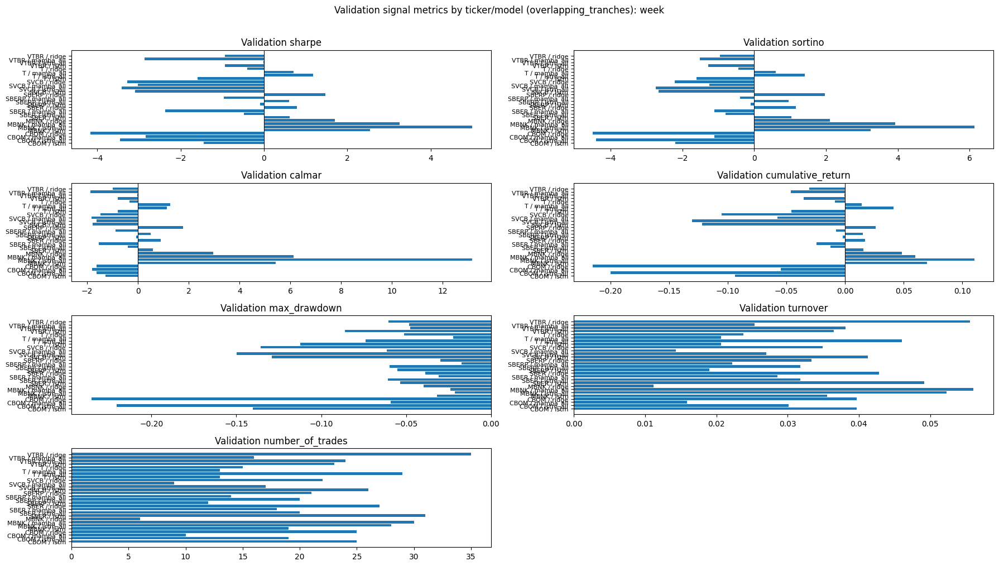

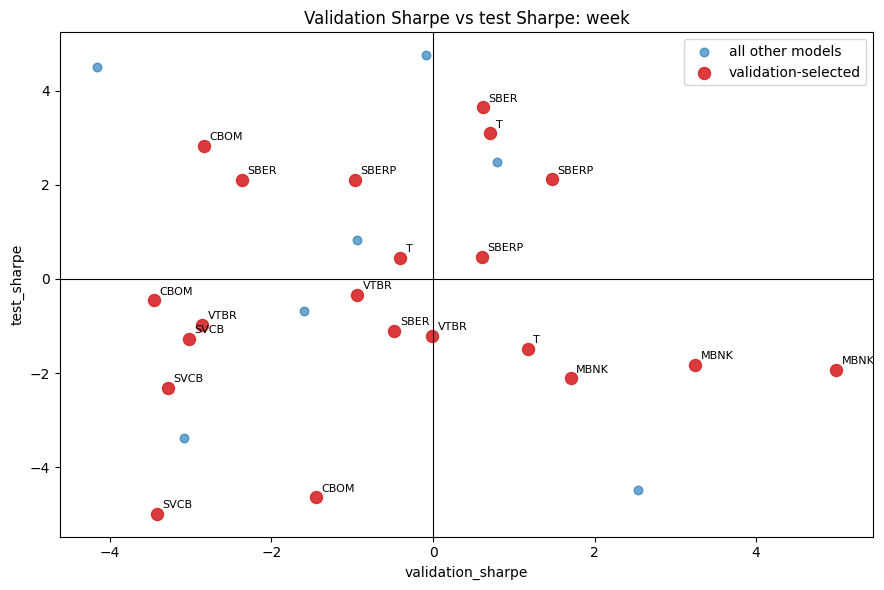

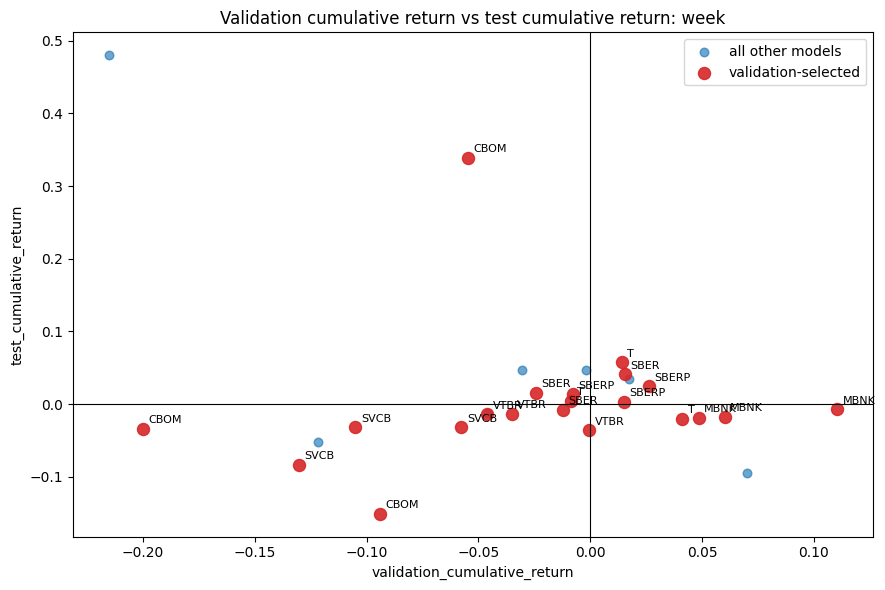

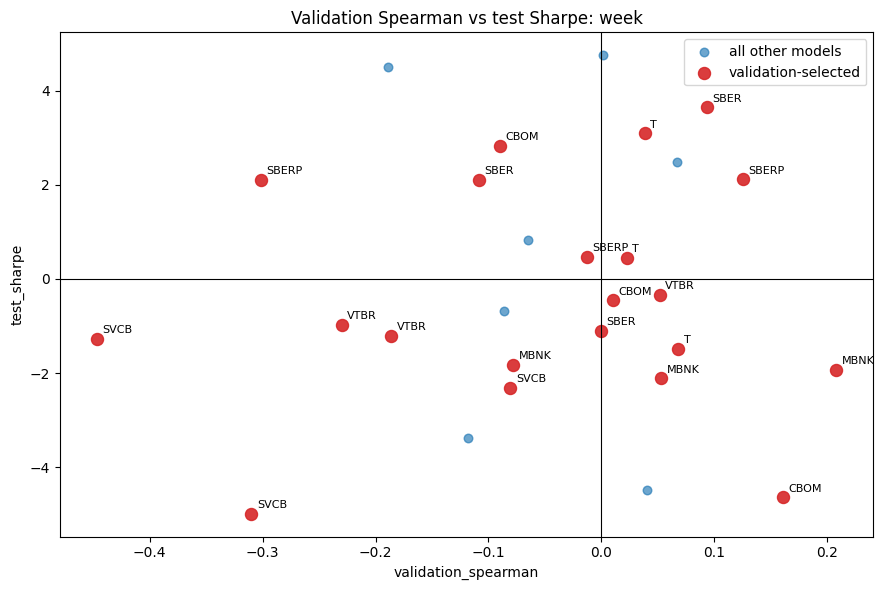

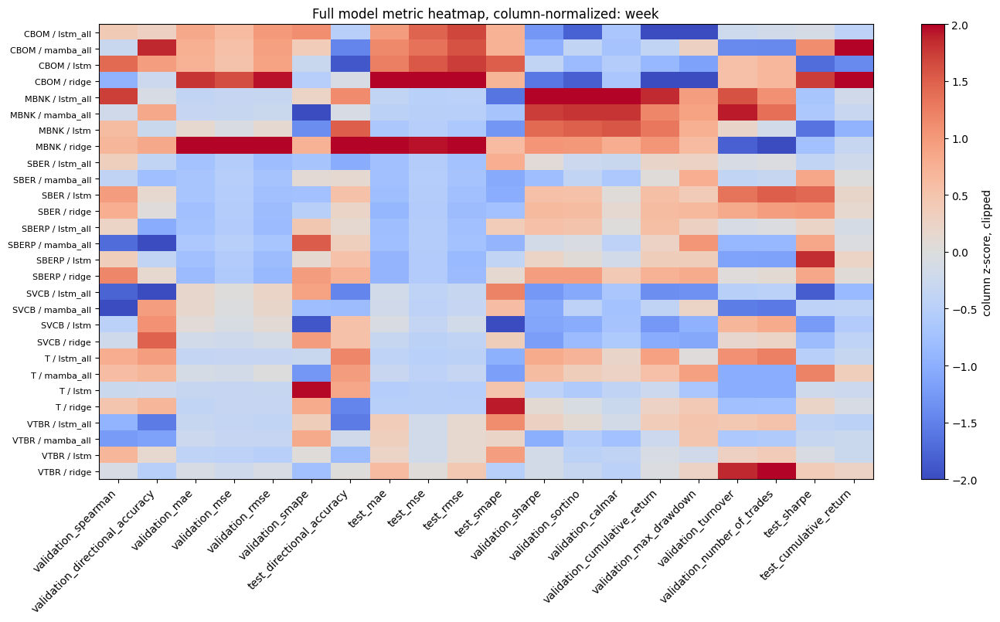

...

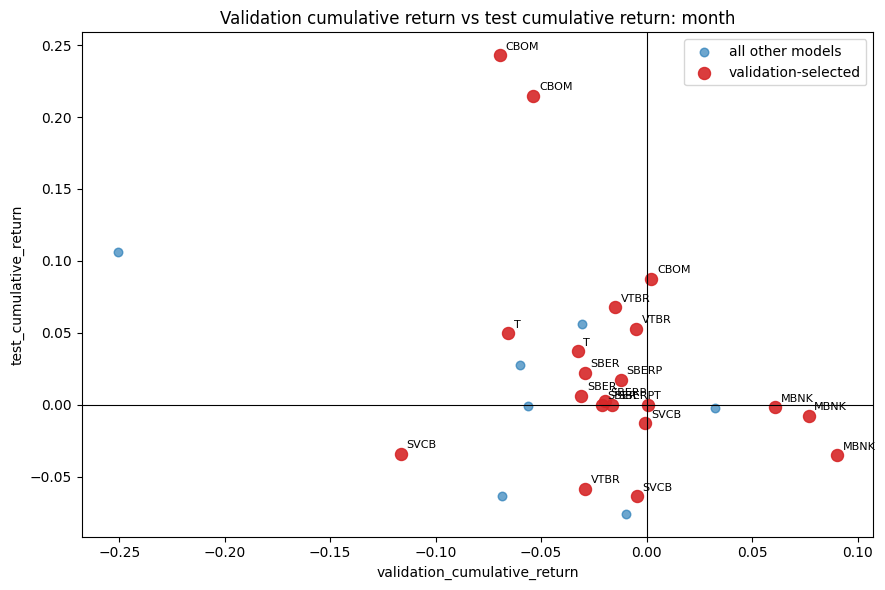

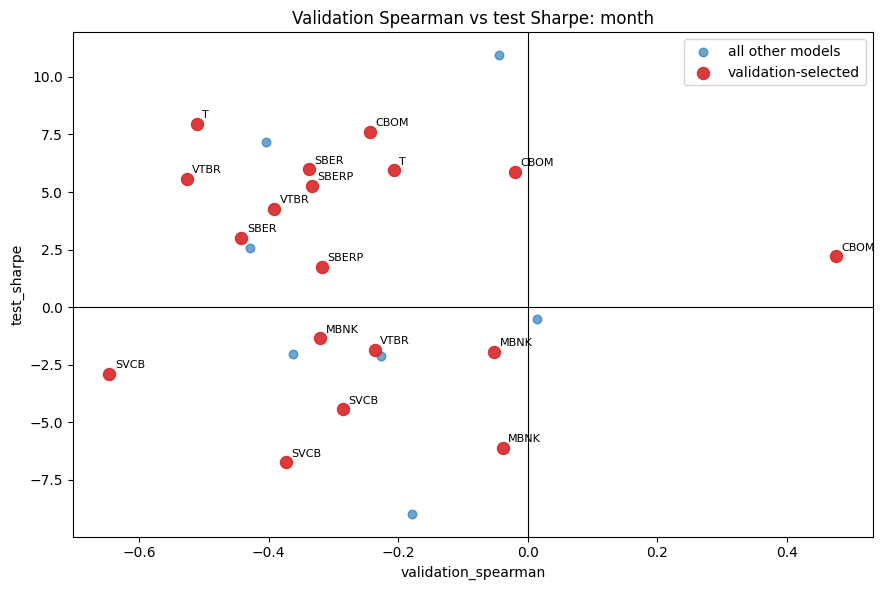

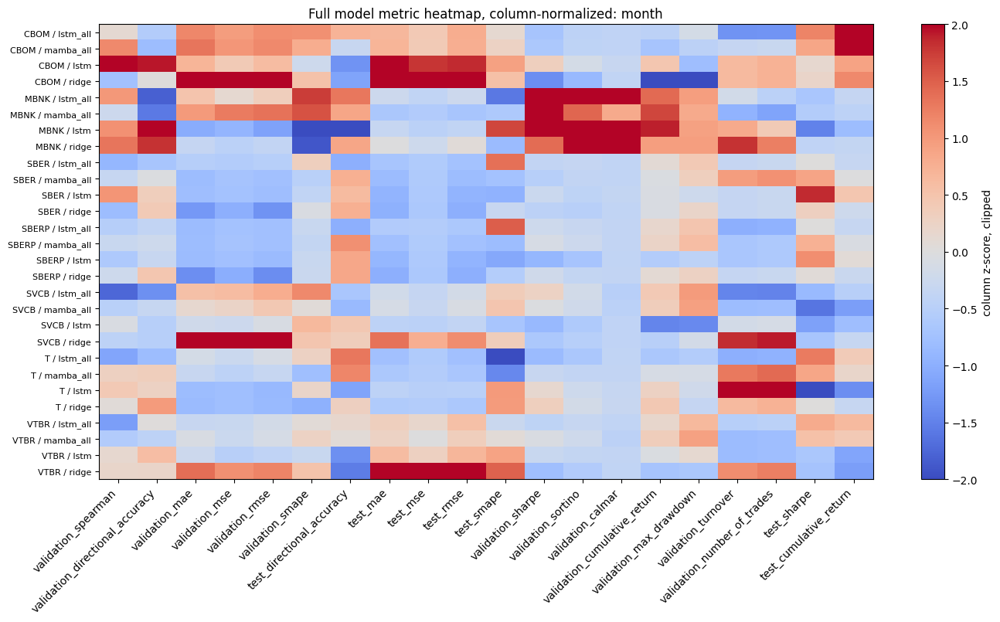

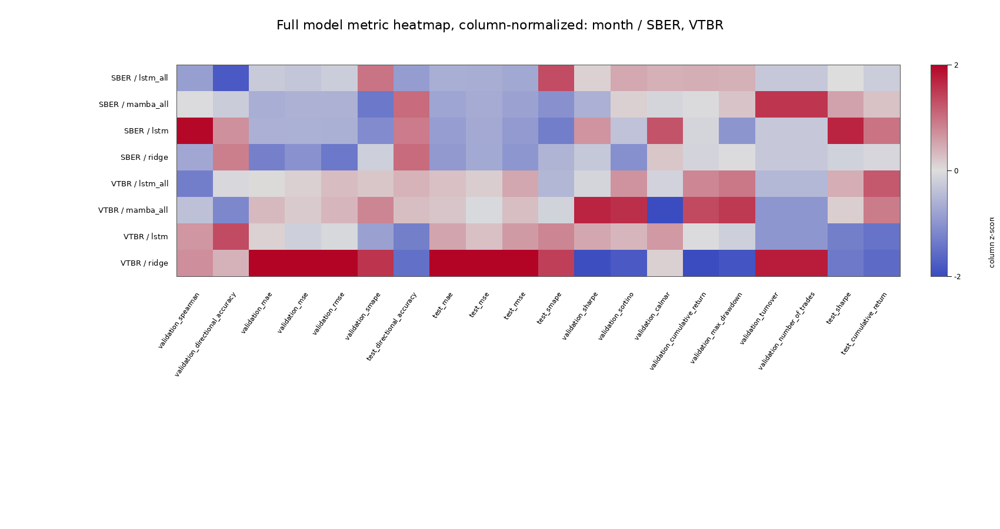

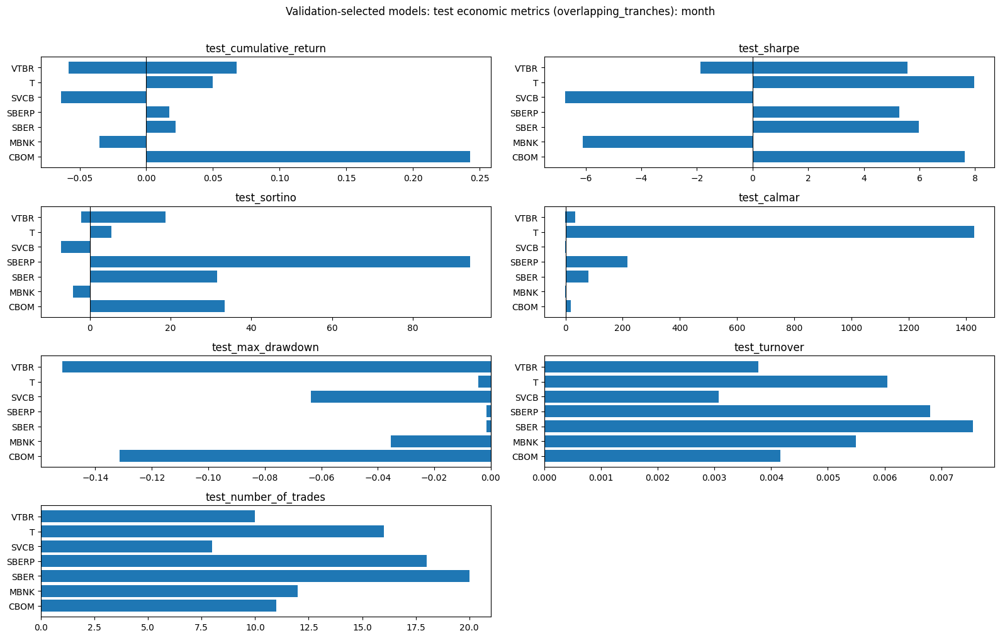

In [7]:
def plot_validation_signal_metric_bars(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    plot_cols = [col for col in VALIDATION_BAR_METRIC_COLS if col in validation_signal.columns]
    if validation_signal.empty or not plot_cols:
        return

    plot_data = validation_signal.sort_values(["ticker", "model_name"]).copy()
    plot_data["ticker_model"] = plot_data["ticker"].astype(str) + " / " + plot_data["model_name"].astype(str)
    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig_height = max(10, 2 + len(plot_data) * 0.25)
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, fig_height), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(plot_data["ticker_model"], plot_data[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(f"Validation {col}")
        ax.tick_params(axis="y", labelsize=8)
    fig.suptitle(f"Validation signal metrics by ticker/model ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "validation_signal_metrics_by_ticker_model.png", dpi=150, bbox_inches="tight")
    plt.show()


def plot_metric_scatter(result: dict, x_col: str, y_col: str, title: str, filename: str) -> None:
    comparison = result["validation_model_metric_comparison"]
    if x_col not in comparison.columns or y_col not in comparison.columns:
        return
    plot_data = comparison[["ticker", "model_name", "is_validation_selected", x_col, y_col]].replace([np.inf, -np.inf], np.nan).dropna(subset=[x_col, y_col])
    if plot_data.empty:
        return

    selected = plot_data[plot_data["is_validation_selected"].fillna(False).astype(bool)]
    other = plot_data.drop(selected.index)
    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(other[x_col], other[y_col], s=38, alpha=0.65, label="all other models")
    if not selected.empty:
        ax.scatter(selected[x_col], selected[y_col], s=75, alpha=0.9, label="validation-selected", color="tab:red")
        for _, row in selected.iterrows():
            ax.annotate(str(row["ticker"]), (row[x_col], row[y_col]), fontsize=8, xytext=(4, 4), textcoords="offset points")
    ax.axhline(0, color="black", linewidth=0.8)
    ax.axvline(0, color="black", linewidth=0.8)
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(title)
    ax.legend()
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / filename, dpi=150, bbox_inches="tight")
    plt.show()


def plot_full_metric_heatmap(
    horizon_name: str,
    result: dict,
    tickers: list[str] | None = None,
    filename: str = "validation_test_metric_heatmap.png",
) -> None:
    comparison = result["validation_model_metric_comparison"].copy()
    title_suffix = ""
    if tickers is not None:
        if "ticker" not in comparison.columns:
            return
        comparison = comparison[comparison["ticker"].isin(tickers)].copy()
        title_suffix = " / " + ", ".join(tickers)
    heatmap_cols = [
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_mae",
        "validation_mse",
        "validation_rmse",
        "validation_smape",
        "test_directional_accuracy",
        "test_mae",
        "test_mse",
        "test_rmse",
        "test_smape",
        "validation_sharpe",
        "validation_sortino",
        "validation_calmar",
        "validation_cumulative_return",
        "validation_max_drawdown",
        "validation_turnover",
        "validation_number_of_trades",
        "test_sharpe",
        "test_cumulative_return",
    ]
    heatmap_cols = [col for col in heatmap_cols if col in comparison.columns]
    if comparison.empty or not heatmap_cols:
        return

    heatmap = comparison.set_index("ticker_model")[heatmap_cols].replace([np.inf, -np.inf], np.nan)
    normalized = (heatmap - heatmap.mean()) / heatmap.std(ddof=0).replace(0, np.nan)
    normalized = normalized.fillna(0.0).clip(-2.0, 2.0)
    fig_width = max(14, 5 + len(heatmap_cols) * 0.6)
    fig_height = max(8, 2 + len(heatmap) * 0.22)
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    image = ax.imshow(normalized.to_numpy(), aspect="auto", cmap="coolwarm", vmin=-2, vmax=2)
    ax.set_xticks(np.arange(len(heatmap_cols)))
    ax.set_xticklabels(heatmap_cols, rotation=55, ha="right", rotation_mode="anchor", fontsize=8)
    ax.tick_params(axis="x", pad=2)
    ax.set_yticks(np.arange(len(heatmap.index)))
    ax.set_yticklabels(heatmap.index, fontsize=8)
    ax.set_title(f"Full model metric heatmap, column-normalized: {horizon_name}{title_suffix}")
    fig.colorbar(image, ax=ax, label="column z-score, clipped")
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / filename, dpi=150, bbox_inches="tight")
    plt.show()


def plot_selected_test_metric_bars(horizon_name: str, result: dict) -> None:
    comparison = result["validation_model_metric_comparison"]
    if "is_validation_selected" not in comparison.columns:
        return
    selected = comparison[comparison["is_validation_selected"].fillna(False).astype(bool)].sort_values("ticker")
    plot_cols = [col for col in ["test_cumulative_return", "test_sharpe", "test_sortino", "test_calmar", "test_max_drawdown", "test_turnover", "test_number_of_trades"] if col in selected.columns]
    if selected.empty or not plot_cols:
        return

    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 10), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(selected["ticker"].astype(str), selected[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(col)
    fig.suptitle(f"Validation-selected models: test economic metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "selected_models_test_economic_metrics.png", dpi=150, bbox_inches="tight")
    plt.show()


for horizon_name, result in horizon_results.items():
    plot_validation_signal_metric_bars(horizon_name, result)
    plot_metric_scatter(result, "validation_sharpe", "test_sharpe", f"Validation Sharpe vs test Sharpe: {horizon_name}", "validation_sharpe_vs_test_sharpe.png")
    plot_metric_scatter(result, "validation_cumulative_return", "test_cumulative_return", f"Validation cumulative return vs test cumulative return: {horizon_name}", "validation_cumulative_return_vs_test_cumulative_return.png")
    plot_metric_scatter(result, "validation_spearman", "test_sharpe", f"Validation Spearman vs test Sharpe: {horizon_name}", "validation_spearman_vs_test_sharpe.png")
    plot_full_metric_heatmap(horizon_name, result)
    plot_full_metric_heatmap(
        horizon_name,
        result,
        tickers=["SBER", "VTBR"],
        filename="validation_test_metric_heatmap_sber_vtbr.png",
    )
    plot_selected_test_metric_bars(horizon_name, result)


## Test Prediction Metrics

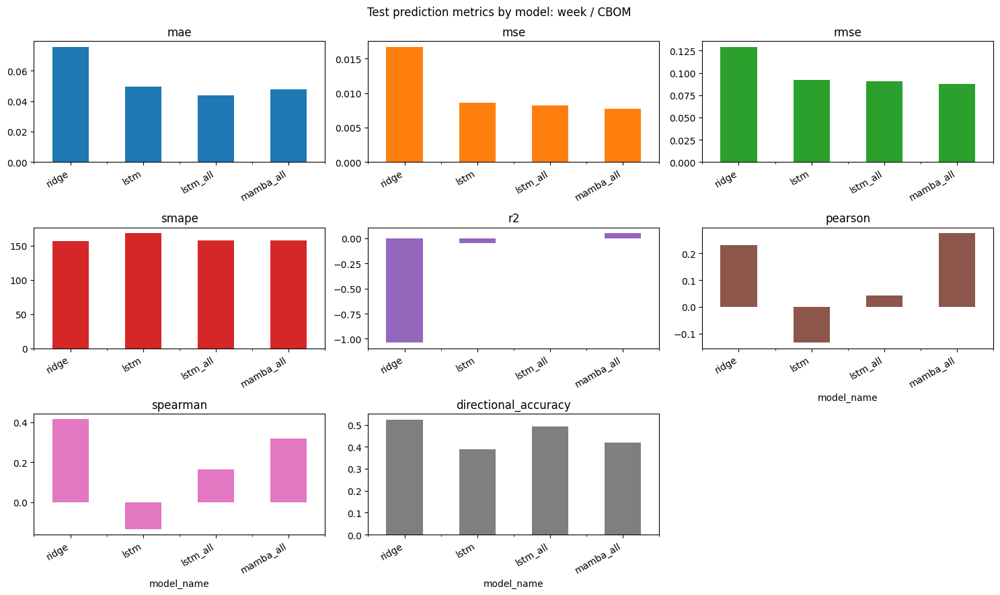

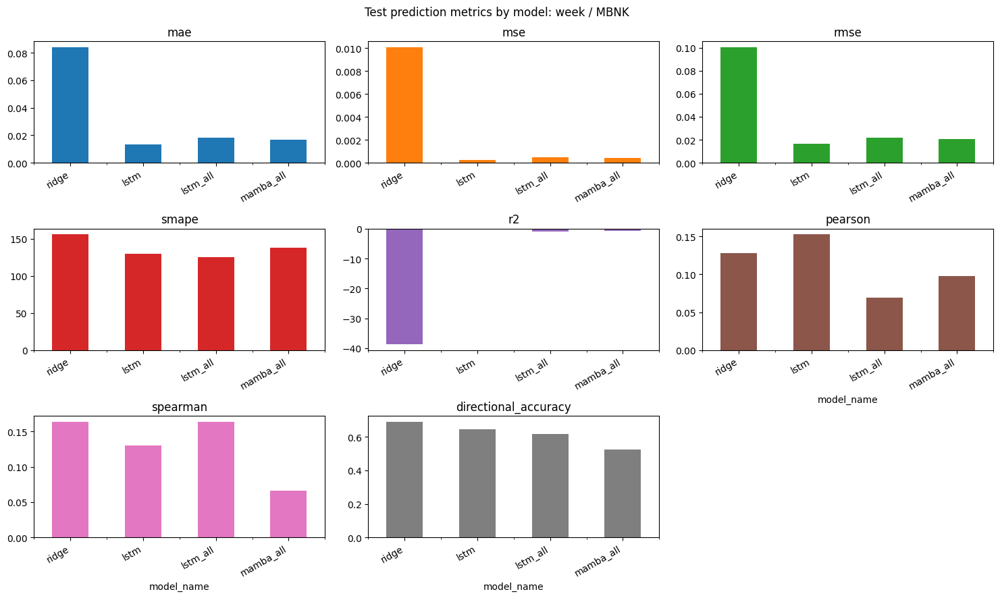

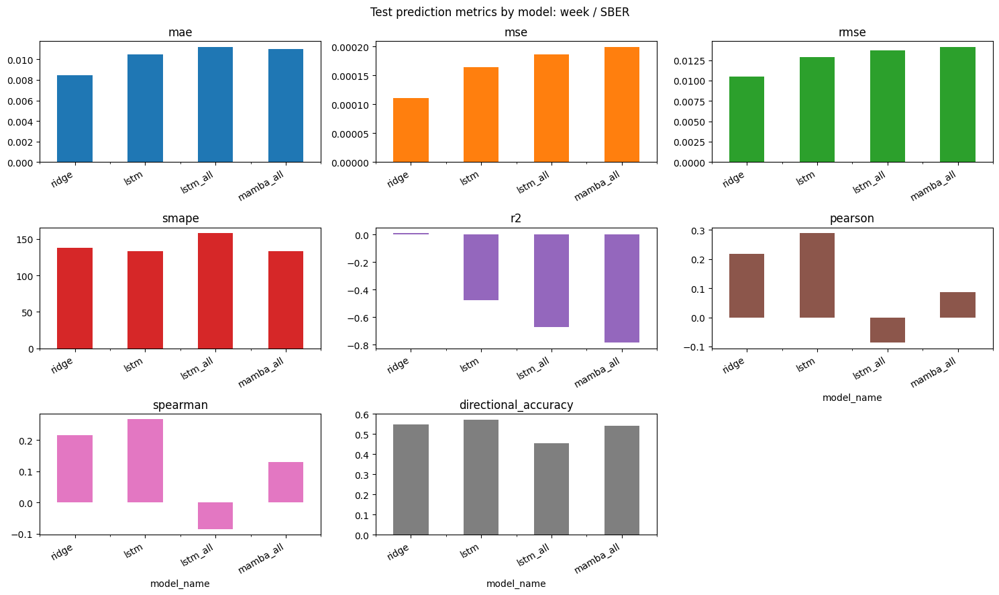

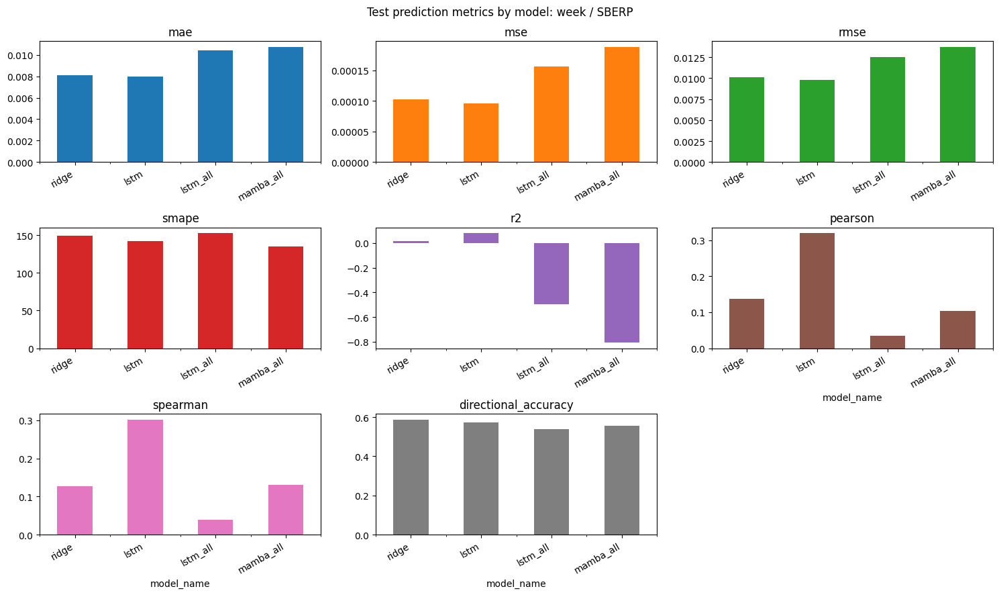

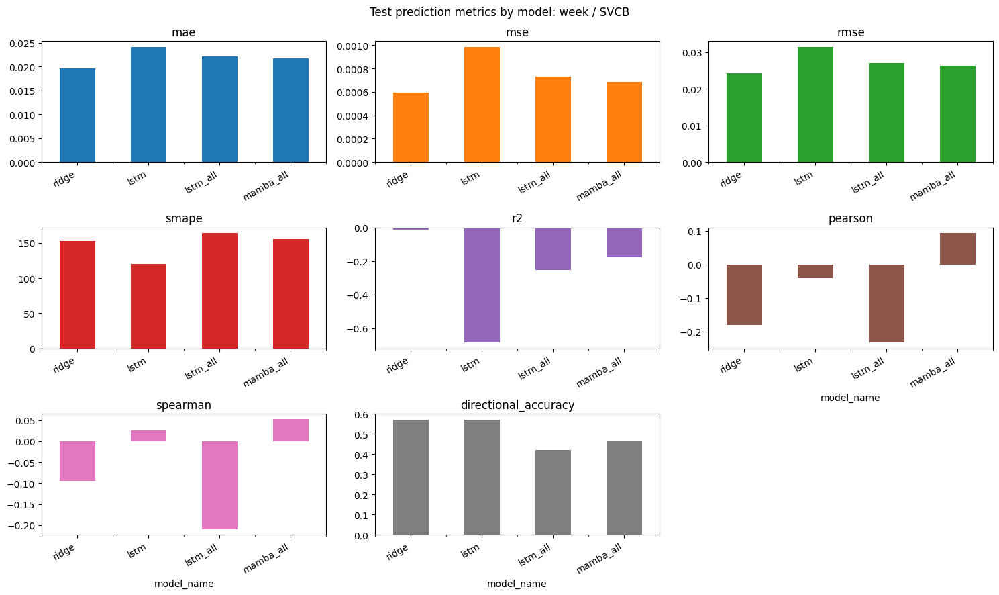

...

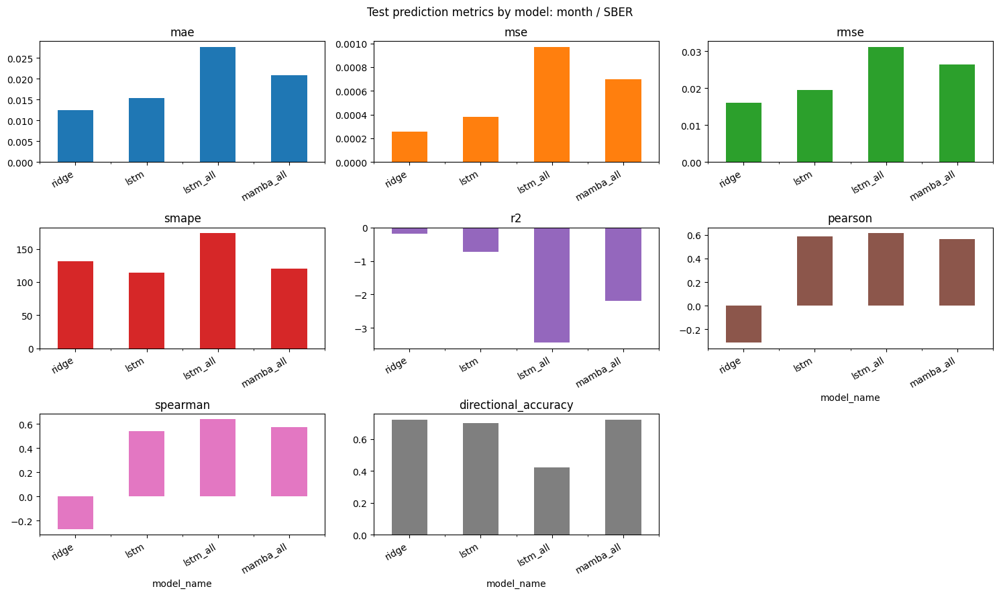

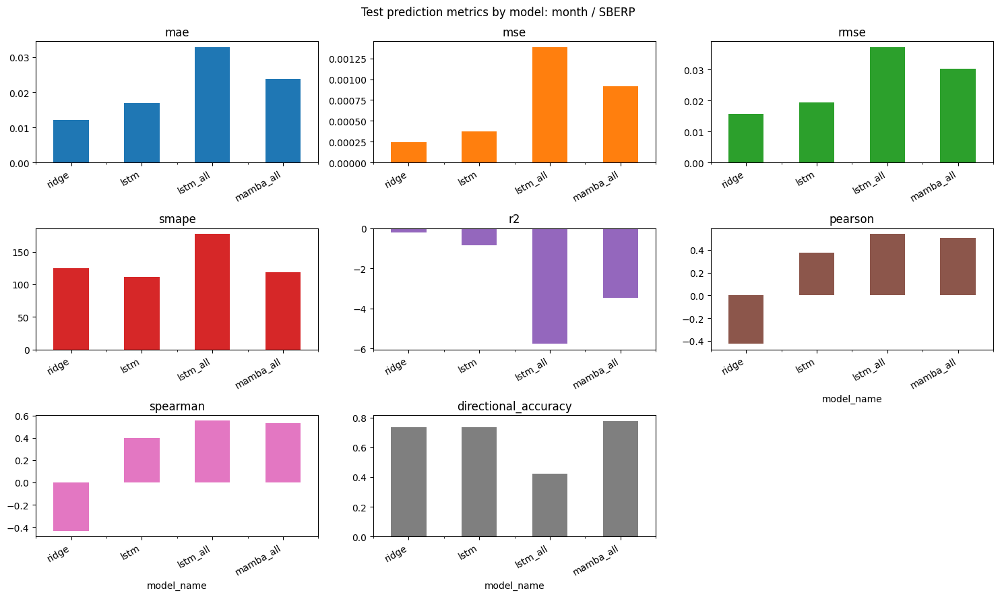

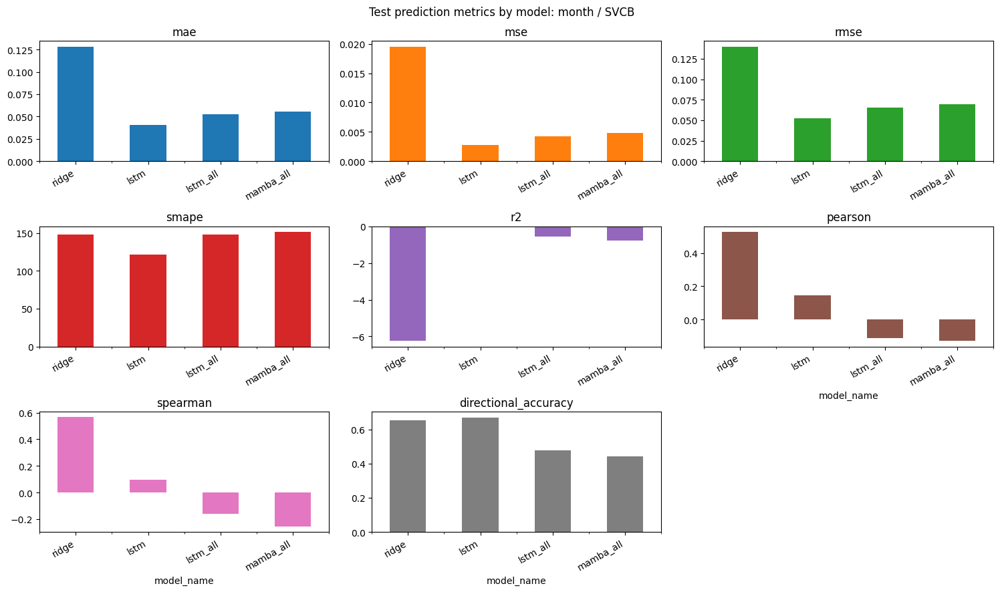

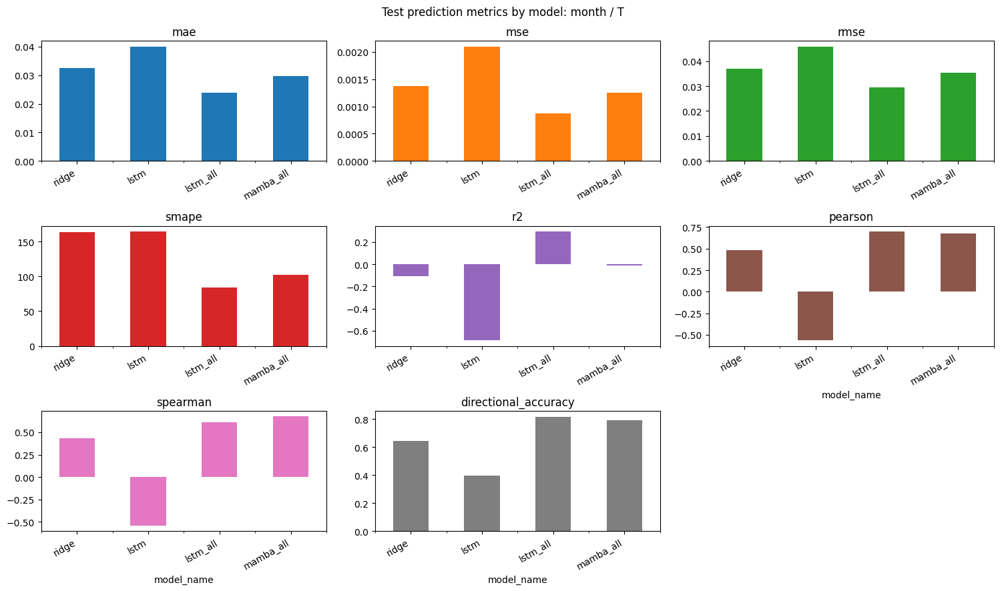

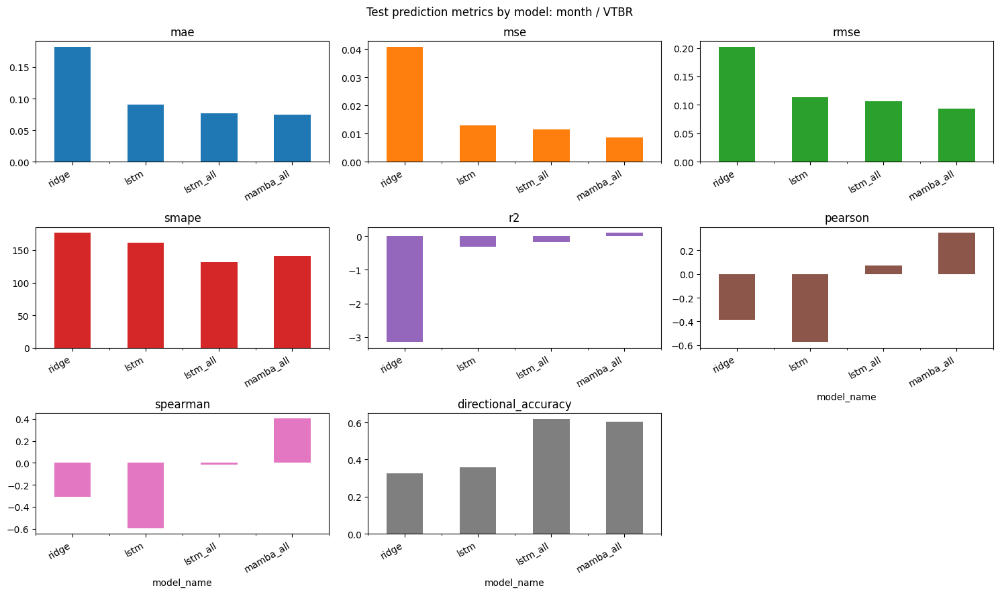

In [8]:
for horizon_name, result in horizon_results.items():
    metrics = result["test_prediction_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    for ticker in result["plot_tickers"]:
        ticker_metrics = metrics[metrics["ticker"].astype(str) == ticker]
        plot_cols = [col for col in PREDICTION_METRIC_COLS if col in ticker_metrics.columns]
        if ticker_metrics.empty or not plot_cols:
            continue
        plot_data = ticker_metrics.set_index("model_name")[plot_cols]
        model_labels = plot_data.index.astype(str).tolist()
        ncols = min(3, max(len(plot_cols), 1))
        nrows = int(np.ceil(len(plot_cols) / ncols))
        axes = plot_data.plot(
            kind="bar",
            subplots=True,
            layout=(nrows, ncols),
            figsize=(5 * ncols, 3 * nrows),
            legend=False,
            title=f"Test prediction metrics by model: {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            if not ax.has_data():
                ax.set_visible(False)
                continue
            ax.set_xticks(np.arange(len(model_labels)))
            ax.set_xticklabels(model_labels, rotation=30, ha="right")
            ax.tick_params(axis="x", labelbottom=True)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_filename(ticker)}_test_prediction_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Predicted Vs Actual And Distributions For Each Ticker


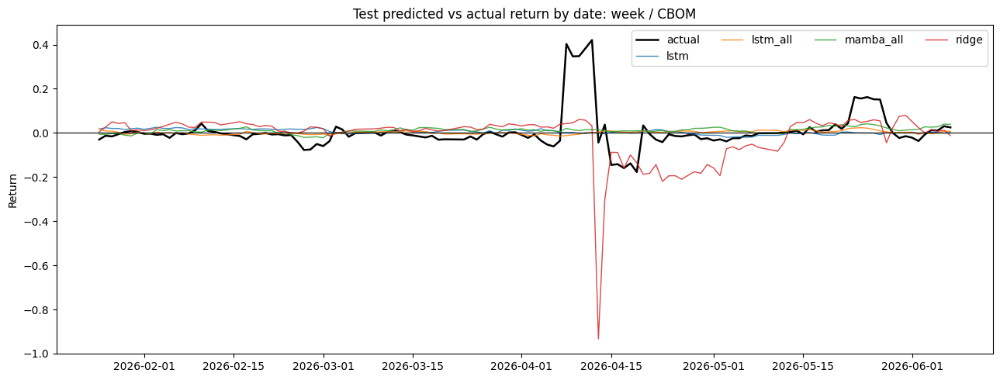

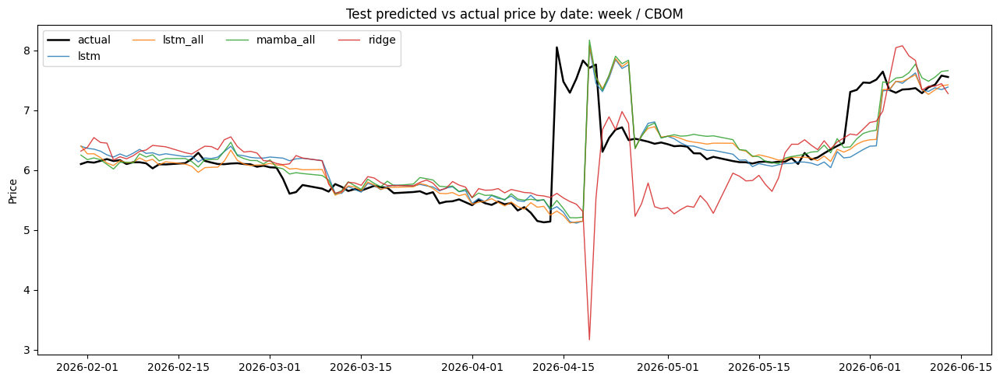

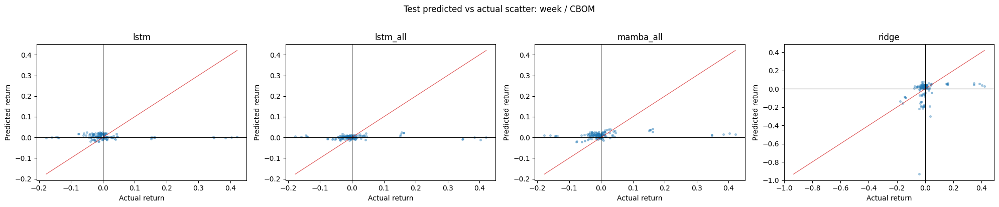

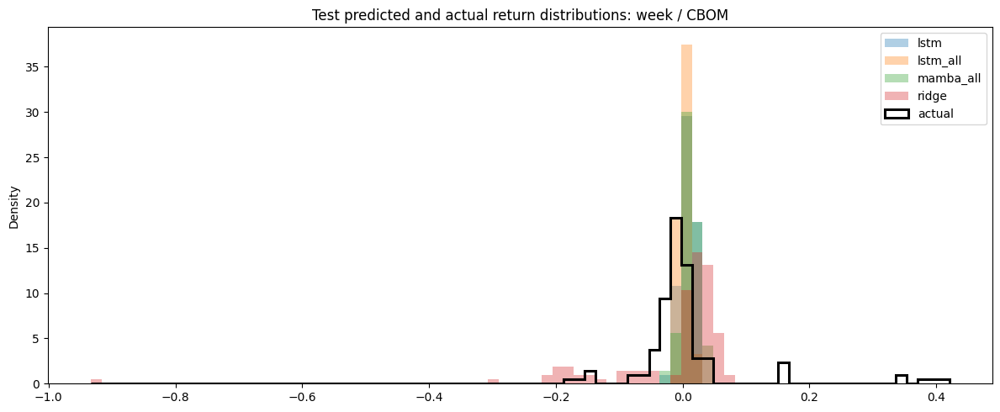

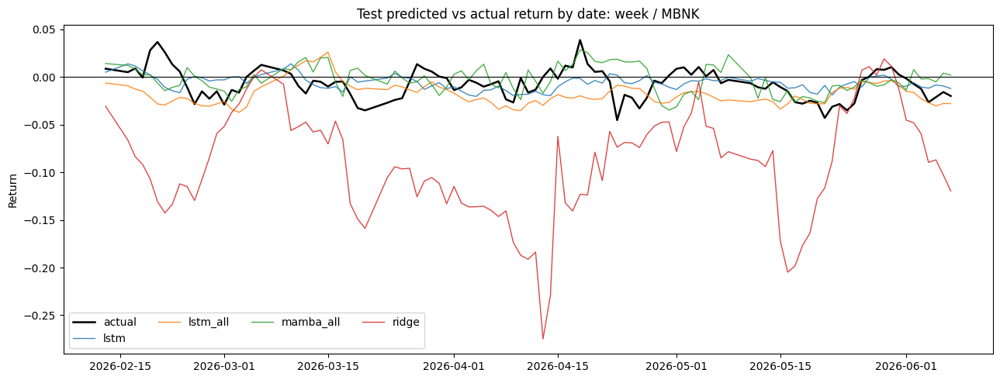

...

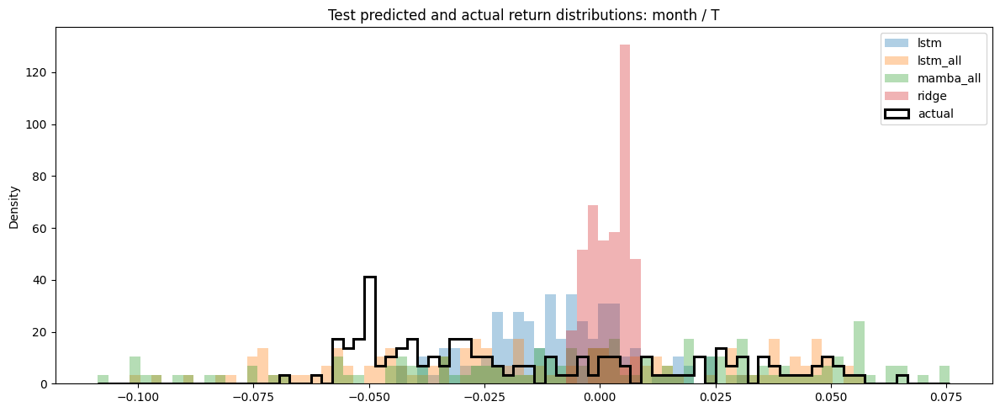

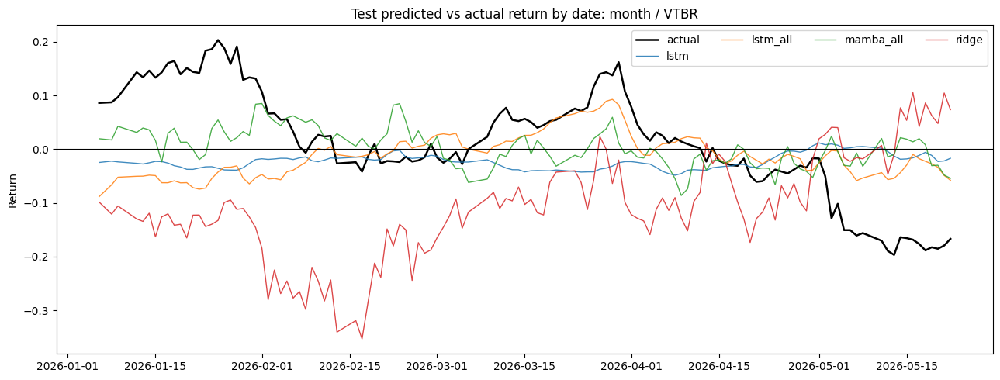

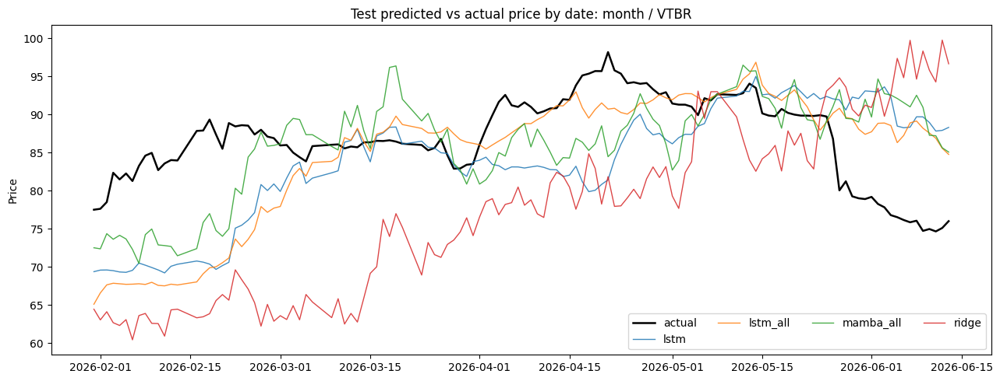

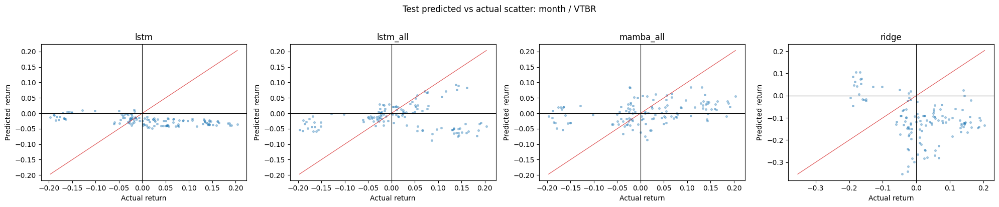

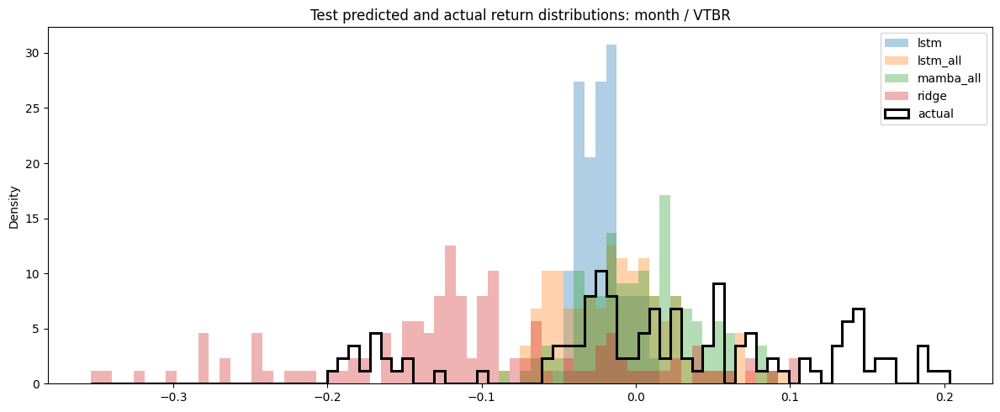

In [9]:
for horizon_name, result in horizon_results.items():
    test_predictions = result["test_predictions"]
    ticker_plots_dir = result["ticker_plots_dir"]
    models = sorted(test_predictions["model_name"].dropna().astype(str).unique())

    for ticker in result["plot_tickers"]:
        ticker_predictions = test_predictions[test_predictions["ticker"].astype(str) == ticker].sort_values("date")
        if ticker_predictions.empty:
            continue
        safe_ticker = safe_filename(ticker)

        actual = ticker_predictions.drop_duplicates(["date", "ticker"]).sort_values("date")
        fig, ax = plt.subplots(figsize=(13, 5))
        ax.plot(actual["date"], actual["y_true"], color="black", linewidth=1.8, label="actual")
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            ax.plot(group["date"], group["y_pred"], linewidth=1.0, alpha=0.85, label=str(model_name))
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(f"Test predicted vs actual return by date: {horizon_name} / {ticker}")
        ax.set_ylabel("Return")
        ax.legend(ncol=min(ticker_predictions["model_name"].nunique() + 1, 4))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_by_date.png", dpi=150, bbox_inches="tight")
        plt.show()

        price_required_cols = {"target_date", "entry_open", "future_open", "y_pred", "model_name"}
        missing_price_cols = sorted(price_required_cols - set(ticker_predictions.columns))
        if missing_price_cols:
            print(f"Skipping price plot for {horizon_name} / {ticker}; missing columns: {missing_price_cols}")
        else:
            actual_price = ticker_predictions.drop_duplicates(["target_date", "ticker"]).sort_values("target_date")
            actual_price = actual_price.dropna(subset=["target_date", "future_open"])
            fig, ax = plt.subplots(figsize=(13, 5))
            ax.plot(actual_price["target_date"], actual_price["future_open"], color="black", linewidth=1.8, label="actual")
            plotted_price_models = 0
            for model_name, group in ticker_predictions.groupby("model_name", sort=True):
                price_group = group.dropna(subset=["target_date", "entry_open", "y_pred"]).sort_values("target_date")
                if price_group.empty:
                    continue
                predicted_price = price_group["entry_open"].astype(float) * np.exp(price_group["y_pred"].astype(float))
                ax.plot(price_group["target_date"], predicted_price, linewidth=1.0, alpha=0.85, label=str(model_name))
                plotted_price_models += 1
            if actual_price.empty and plotted_price_models == 0:
                print(f"Skipping price plot for {horizon_name} / {ticker}; no valid price rows")
                plt.close(fig)
            else:
                ax.set_title(f"Test predicted vs actual price by date: {horizon_name} / {ticker}")
                ax.set_ylabel("Price")
                ax.legend(ncol=min(plotted_price_models + 1, 4))
                fig.tight_layout()
                fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_price_by_date.png", dpi=150, bbox_inches="tight")
                plt.show()

        n_models = max(len(models), 1)
        ncols = min(n_models, 4)
        nrows = int(np.ceil(n_models / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)
        for ax in axes.ravel():
            ax.set_visible(False)
        for ax, model_name in zip(axes.ravel(), models):
            ax.set_visible(True)
            part = ticker_predictions[ticker_predictions["model_name"].astype(str) == model_name]
            part = part[["y_true", "y_pred"]].dropna()
            if len(part) > SCATTER_SAMPLE:
                part = part.sample(SCATTER_SAMPLE, random_state=42)
            ax.scatter(part["y_true"], part["y_pred"], s=7, alpha=0.35)
            if not part.empty:
                lo = float(np.nanmin([part["y_true"].min(), part["y_pred"].min()]))
                hi = float(np.nanmax([part["y_true"].max(), part["y_pred"].max()]))
                ax.plot([lo, hi], [lo, hi], color="tab:red", linewidth=0.9, alpha=0.75, label="y = x")
            ax.axhline(0, color="black", linewidth=0.8)
            ax.axvline(0, color="black", linewidth=0.8)
            ax.set_title(str(model_name))
            ax.set_xlabel("Actual return")
            ax.set_ylabel("Predicted return")
        fig.suptitle(f"Test predicted vs actual scatter: {horizon_name} / {ticker}", y=1.02)
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_scatter.png", dpi=150, bbox_inches="tight")
        plt.show()

        actual_returns = actual["y_true"].dropna()
        predicted_returns = ticker_predictions["y_pred"].dropna()
        combined_returns = pd.concat([predicted_returns, actual_returns], ignore_index=True)
        if combined_returns.empty:
            continue
        distribution_bins = np.histogram_bin_edges(combined_returns, bins=80)
        fig, ax = plt.subplots(figsize=(12, 5))
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            group["y_pred"].dropna().plot(
                kind="hist",
                bins=distribution_bins,
                alpha=0.35,
                ax=ax,
                label=str(model_name),
                density=True,
            )
        ax.hist(actual_returns, bins=distribution_bins, density=True, histtype="step", linewidth=2.2, color="black", label="actual")
        ax.set_title(f"Test predicted and actual return distributions: {horizon_name} / {ticker}")
        ax.set_ylabel("Density")
        ax.legend()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_prediction_distribution.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Signal Equity And Metrics

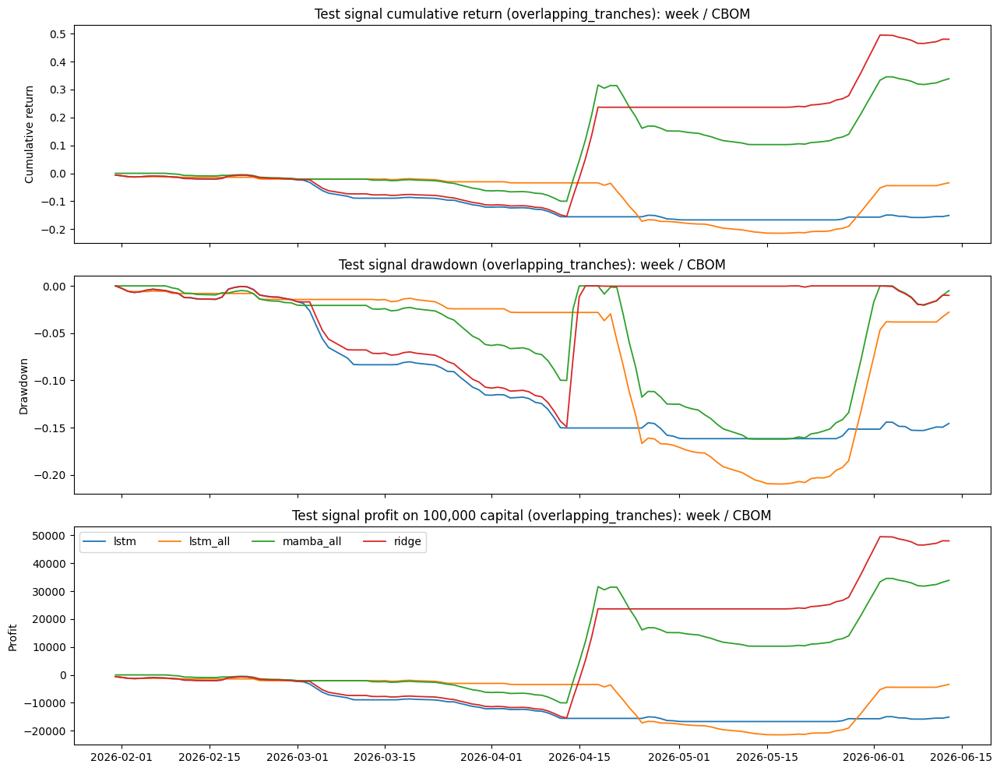

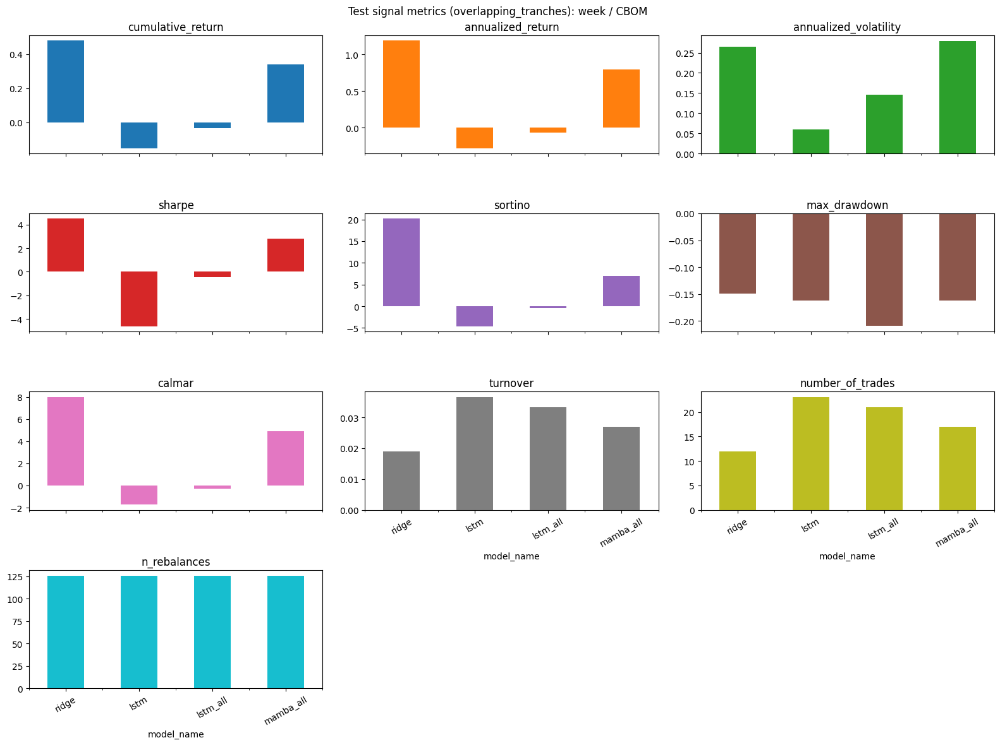

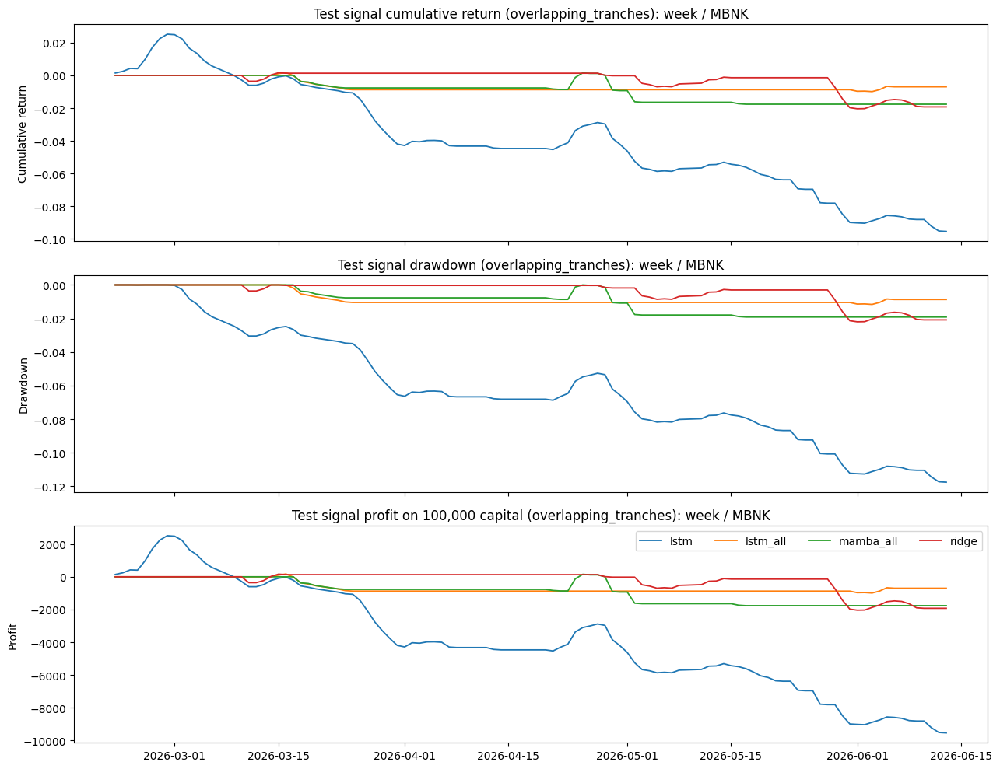

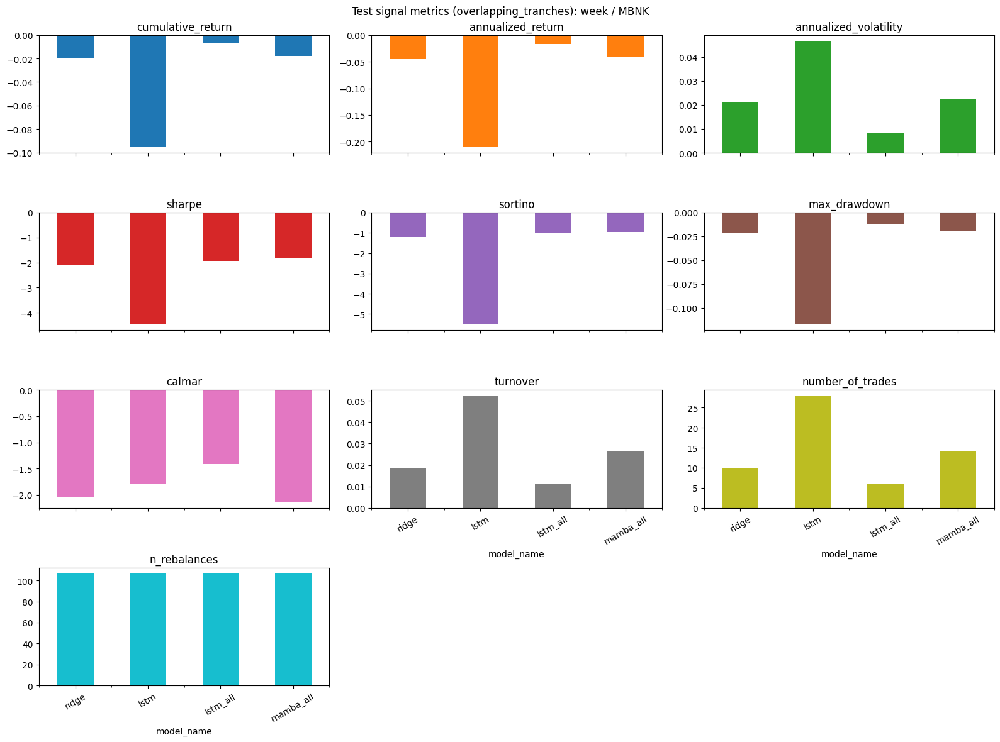

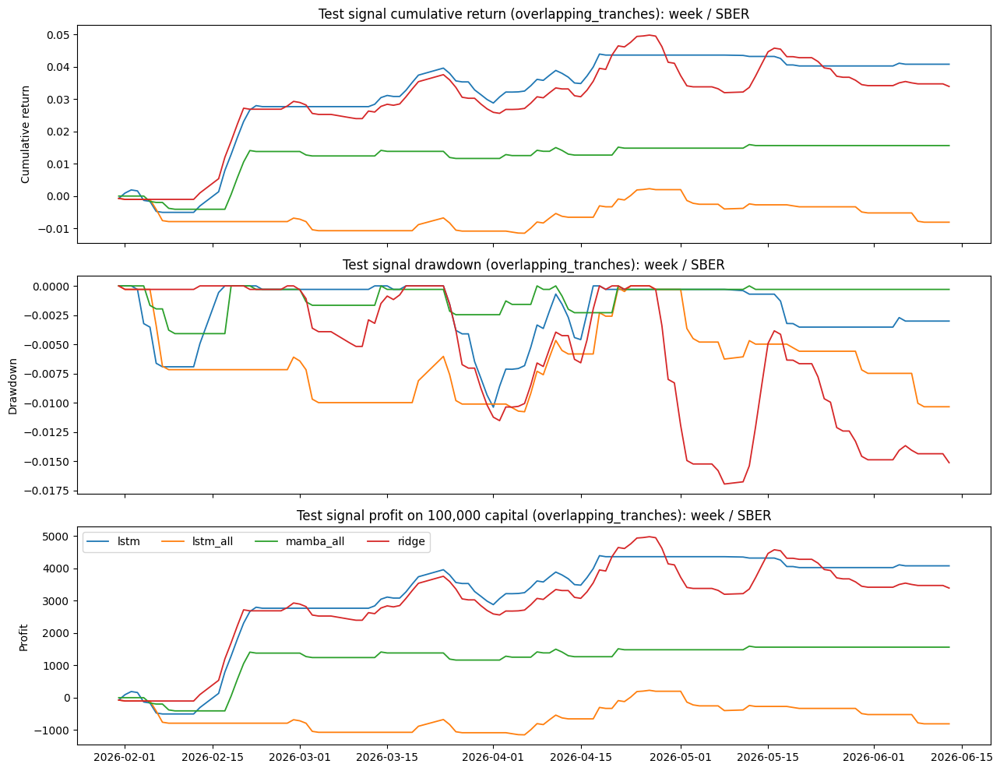

...

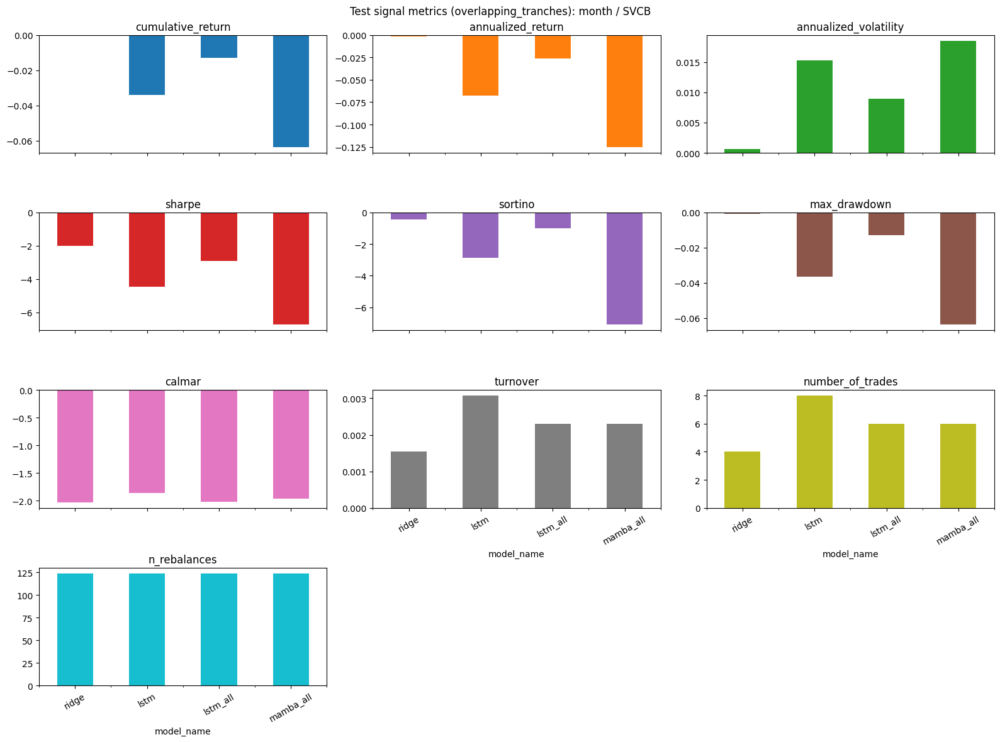

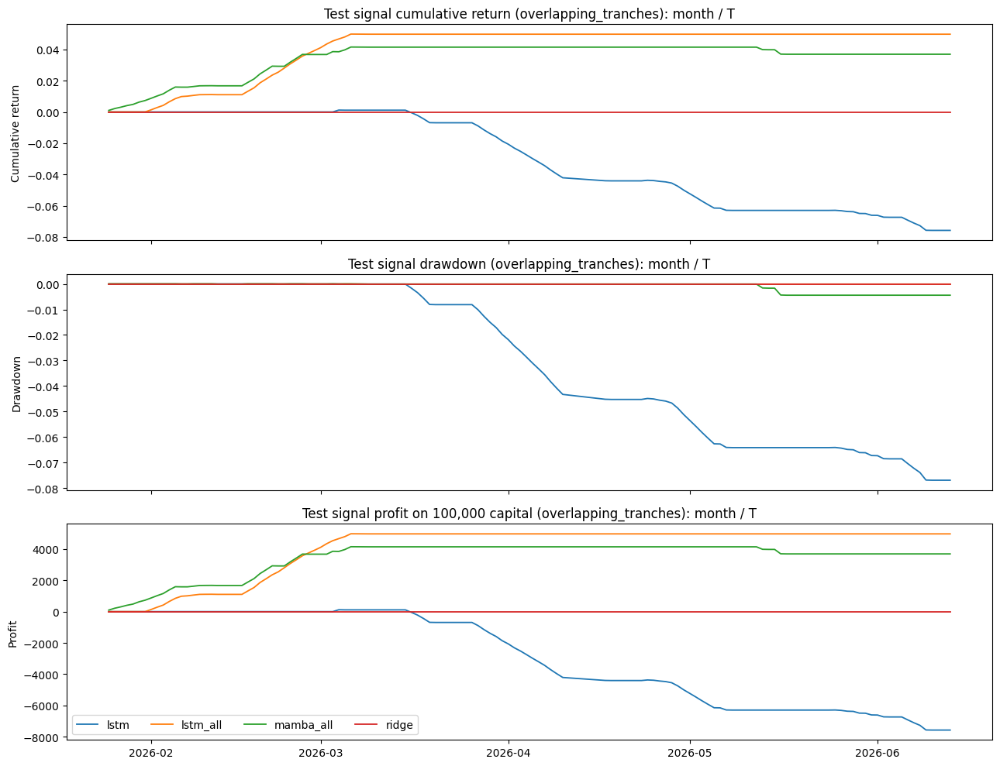

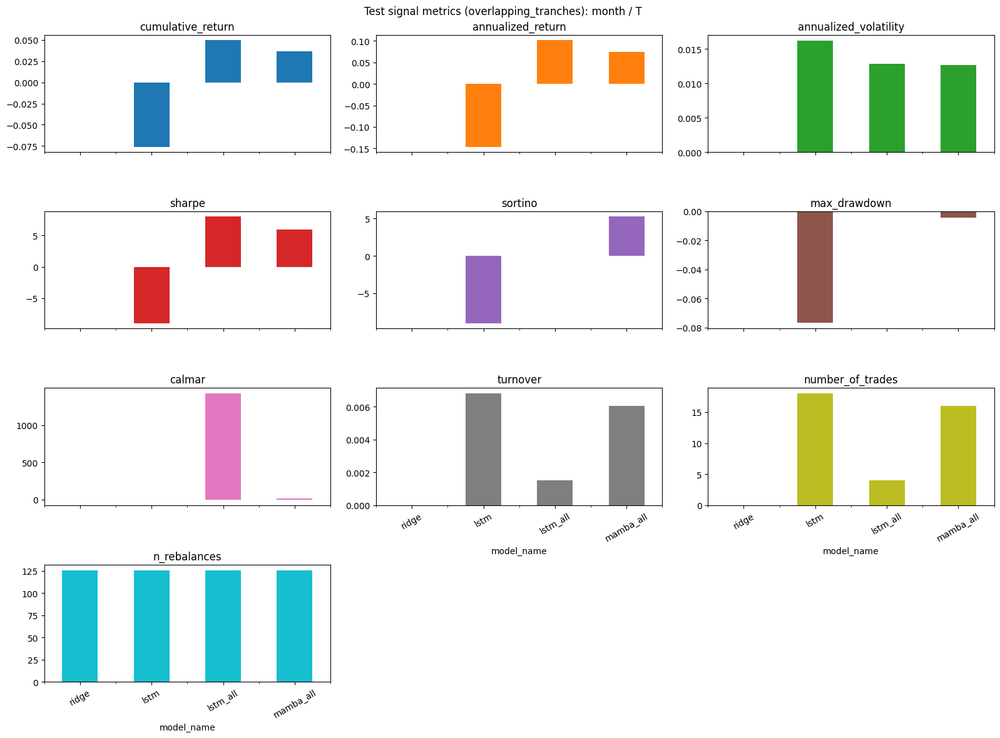

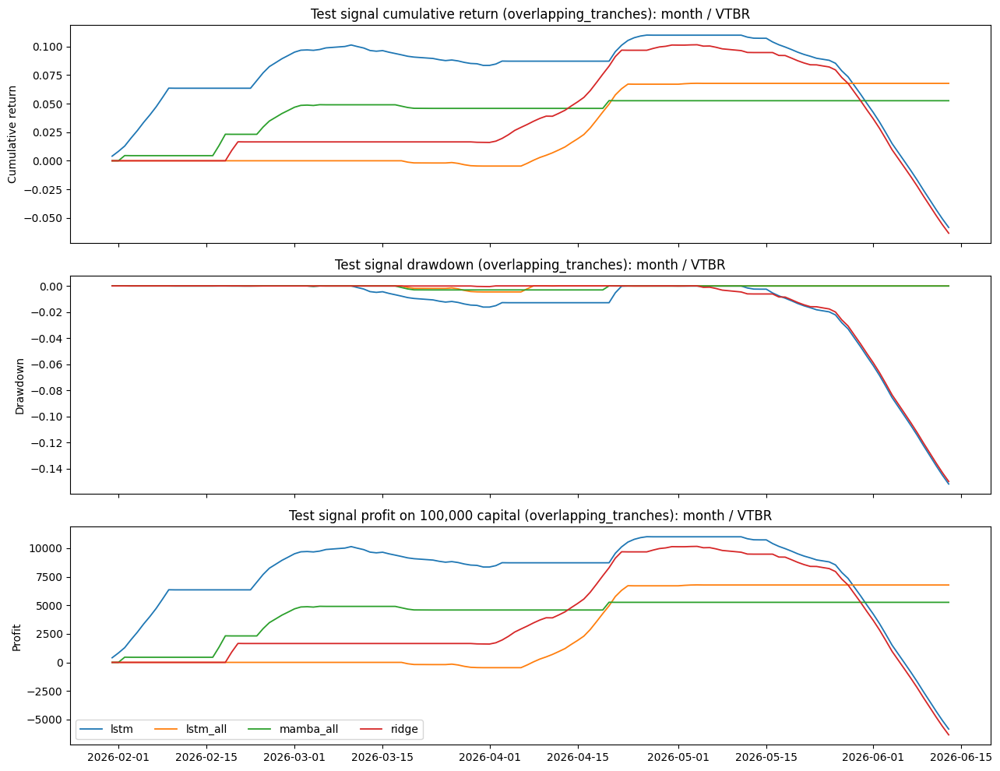

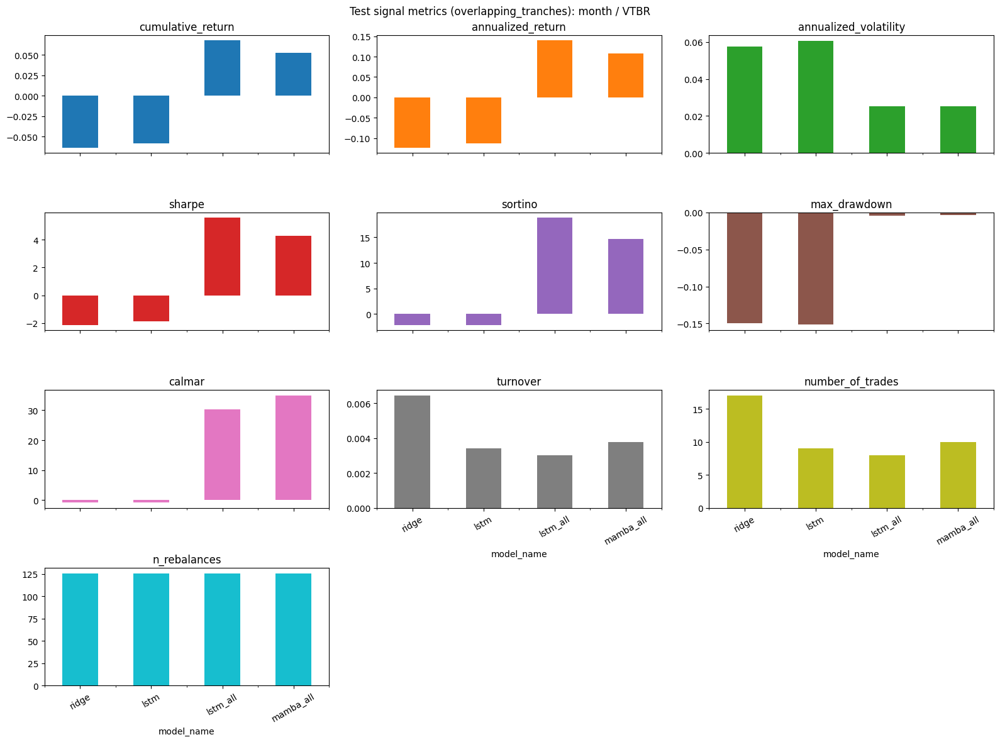

In [10]:
for horizon_name, result in horizon_results.items():
    equity = result["test_signal_equity"]
    signal_metrics = result["test_signal_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    headline_equity = equity[equity["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    headline_metrics = signal_metrics[signal_metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    if headline_equity.empty:
        print(f"No test signal equity data for {horizon_name}")
        continue

    for ticker in result["plot_tickers"]:
        safe_ticker = safe_filename(ticker)
        ticker_equity = headline_equity[headline_equity["ticker"].astype(str) == ticker].sort_values("date")
        ticker_signal_metrics = headline_metrics[headline_metrics["ticker"].astype(str) == ticker]
        if ticker_equity.empty:
            continue

        fig, axes = plt.subplots(3, 1, figsize=(13, 10), sharex=True)
        for model_name, group in ticker_equity.groupby("model_name"):
            axes[0].plot(group["date"], group["cumulative_return"], label=model_name, linewidth=1.3)
            axes[1].plot(group["date"], group["drawdown"], label=model_name, linewidth=1.3)
            axes[2].plot(group["date"], group["cumulative_return"].astype(float) * PROFIT_INITIAL_CAPITAL, label=model_name, linewidth=1.3)
        axes[0].set_title(f"Test signal cumulative return ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[0].set_ylabel("Cumulative return")
        axes[1].set_title(f"Test signal drawdown ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[1].set_ylabel("Drawdown")
        axes[2].set_title(f"Test signal profit on {PROFIT_INITIAL_CAPITAL:,.0f} capital ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[2].set_ylabel("Profit")
        axes[2].legend(ncol=min(ticker_equity["model_name"].nunique(), 5))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_equity_drawdown.png", dpi=150, bbox_inches="tight")
        plt.show()

        plot_cols = [col for col in SIGNAL_METRIC_COLS if col in ticker_signal_metrics.columns]
        if ticker_signal_metrics.empty or not plot_cols:
            continue
        signal_plot = ticker_signal_metrics.set_index("model_name")[plot_cols]
        axes = signal_plot.plot(
            kind="bar",
            subplots=True,
            layout=(4, 3),
            figsize=(16, 12),
            legend=False,
            title=f"Test signal metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            ax.tick_params(axis="x", rotation=30)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Selected Model Buy-And-Hold Benchmarks

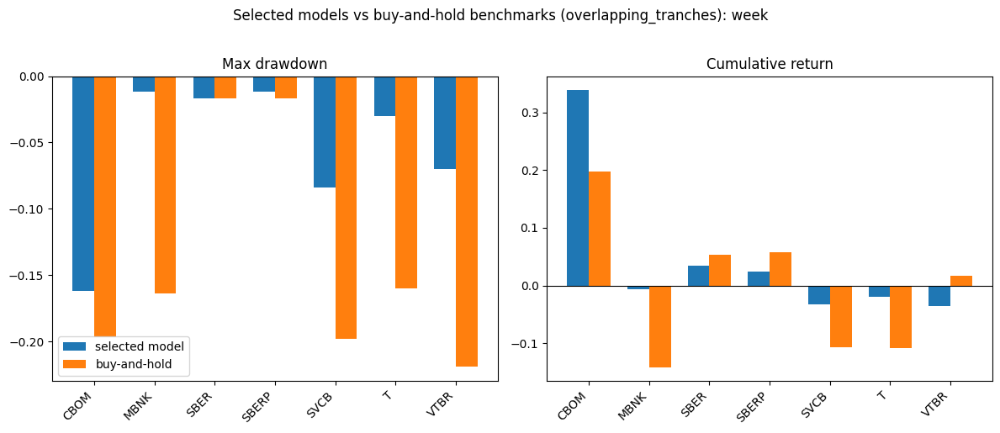

=== Selected model summary metrics: week ===


,ticker,model_name,smape,cumulative_return,drawdown,sharpe,number_of_trades
0,CBOM,mamba_all,157.594937,0.338808,-0.162113,2.831844,17
1,MBNK,lstm_all,125.613018,-0.006987,-0.011607,-1.928554,6
2,SBER,ridge,137.512638,0.033893,-0.016959,2.488488,45
3,SBERP,ridge,149.338553,0.024419,-0.011807,2.120121,47
4,SVCB,mamba_all,155.335006,-0.032099,-0.083936,-1.265651,18
5,T,lstm_all,134.341961,-0.020295,-0.029895,-1.483403,22
6,VTBR,lstm_all,162.563087,-0.036153,-0.069879,-1.207082,22


=== Selected model buy-and-hold benchmark: week ===
Selection rule: validation cumulative_return desc, abs(max_drawdown) asc


,horizon_name,horizon,signal_mode,ticker,selected_model_name,selected_comparison_source,selection_validation_cumulative_return,selection_validation_max_drawdown,selected_model_cumulative_return,selected_model_annualized_return,selected_model_sharpe,selected_model_max_drawdown,selected_model_turnover,selected_model_number_of_trades,buy_hold_cumulative_return,buy_hold_annualized_return,buy_hold_sharpe,buy_hold_max_drawdown,buy_hold_turnover,buy_hold_number_of_trades,excess_cumulative_return,excess_sharpe
0,week,5,overlapping_tranches,CBOM,mamba_all,global_mamba,-0.054846,-0.059145,0.338808,0.792408,2.831844,-0.162113,0.026984,17,0.197468,0.433929,1.505060,-0.196925,0.001587,1,0.141341,1.326784
1,week,5,overlapping_tranches,MBNK,lstm_all,global_lstm,0.110260,-0.021246,-0.006987,-0.016377,-1.928554,-0.011607,0.011215,6,-0.142081,-0.302962,-5.965041,-0.164066,0.001869,1,0.135094,4.036487
2,week,5,overlapping_tranches,SBER,ridge,table,0.017166,-0.038589,0.033893,0.068934,2.488488,-0.016959,0.071429,45,0.052694,0.108164,3.210801,-0.016751,0.001587,1,-0.018801,-0.722313
3,week,5,overlapping_tranches,SBERP,ridge,table,0.026333,-0.029908,0.024419,0.049434,2.120121,-0.011807,0.074603,47,0.057315,0.117915,3.621272,-0.016934,0.001587,1,-0.032896,-1.501152
4,week,5,overlapping_tranches,SVCB,mamba_all,global_mamba,-0.057682,-0.061289,-0.032099,-0.063167,-1.265651,-0.083936,0.028571,18,-0.107314,-0.203113,-2.635335,-0.197940,0.001587,1,0.075216,1.369684
5,week,5,overlapping_tranches,T,lstm_all,global_lstm,0.041186,-0.073848,-0.020295,-0.040178,-1.483403,-0.029895,0.034921,22,-0.109263,-0.206588,-3.258951,-0.160028,0.001587,1,0.088969,1.775548
6,week,5,overlapping_tranches,VTBR,lstm_all,global_lstm,-0.000355,-0.047490,-0.036153,-0.070998,-1.207082,-0.069879,0.034921,22,0.016467,0.033205,0.260135,-0.219084,0.001587,1,-0.052620,-1.467217


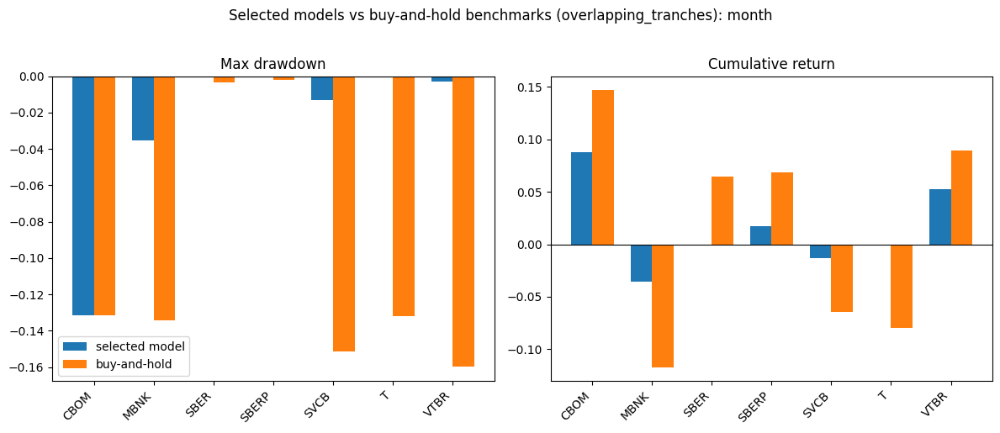

=== Selected model summary metrics: month ===


,ticker,model_name,smape,cumulative_return,drawdown,sharpe,number_of_trades
0,CBOM,lstm,161.914848,0.087485,-0.131442,2.209220,2
1,MBNK,lstm,181.523364,-0.035372,-0.035372,-6.110315,10
2,SBER,lstm_all,173.593774,0.000000,0.000000,NaN,0
3,SBERP,mamba_all,118.237804,0.017141,-0.000160,5.268976,10
4,SVCB,lstm_all,147.984574,-0.012932,-0.012932,-2.906370,6
5,T,ridge,163.693843,0.000000,0.000000,NaN,0
6,VTBR,mamba_all,140.379667,0.052568,-0.003087,4.263962,10


=== Selected model buy-and-hold benchmark: month ===
Selection rule: validation cumulative_return desc, abs(max_drawdown) asc


,horizon_name,horizon,signal_mode,ticker,selected_model_name,selected_comparison_source,selection_validation_cumulative_return,selection_validation_max_drawdown,selected_model_cumulative_return,selected_model_annualized_return,selected_model_sharpe,selected_model_max_drawdown,selected_model_turnover,selected_model_number_of_trades,buy_hold_cumulative_return,buy_hold_annualized_return,buy_hold_sharpe,buy_hold_max_drawdown,buy_hold_turnover,buy_hold_number_of_trades,excess_cumulative_return,excess_sharpe
0,month,21,overlapping_tranches,CBOM,lstm,lstm_only,0.002295,-0.087989,0.087485,0.182623,2.209220,-0.131442,0.000756,2,0.146957,0.315510,3.076582,-0.131442,0.000378,1,-0.059472,-0.867362
1,month,21,overlapping_tranches,MBNK,lstm,lstm_only,0.090387,-0.002958,-0.035372,-0.083563,-6.110315,-0.035372,0.004579,10,-0.117281,-0.260864,-11.703600,-0.134266,0.000458,1,0.081908,5.593286
2,month,21,overlapping_tranches,SBER,lstm_all,global_lstm,-0.021192,-0.028241,0.000000,0.000000,NaN,0.000000,0.000000,0,0.064703,0.133593,11.915748,-0.003294,0.000378,1,-0.064703,NaN
3,month,21,overlapping_tranches,SBERP,mamba_all,global_mamba,-0.012300,-0.019493,0.017141,0.034575,5.268976,-0.000160,0.003779,10,0.068829,0.142396,13.106935,-0.002180,0.000378,1,-0.051688,-7.837959
4,month,21,overlapping_tranches,SVCB,lstm_all,global_lstm,-0.000591,-0.000298,-0.012932,-0.026107,-2.906370,-0.012932,0.002304,6,-0.064338,-0.126412,-3.209549,-0.151408,0.000384,1,0.051405,0.303179
5,month,21,overlapping_tranches,T,ridge,table,0.000647,-0.065693,0.000000,0.000000,NaN,0.000000,0.000000,0,-0.079474,-0.152633,-5.704972,-0.132143,0.000378,1,0.079474,NaN
6,month,21,overlapping_tranches,VTBR,mamba_all,global_mamba,-0.004911,-0.003199,0.052568,0.107900,4.263962,-0.003087,0.003779,10,0.089037,0.186001,2.475213,-0.159826,0.000378,1,-0.036469,1.788749


In [11]:
BENCHMARK_MODEL_NAME = "buy_and_hold"
BENCHMARK_SOURCE = "benchmark"
BENCHMARK_METRIC_COLS = ["cumulative_return", "annualized_return", "sharpe", "max_drawdown", "turnover", "number_of_trades"]
BENCHMARK_SELECTION_DESCRIPTION = "validation cumulative_return desc, abs(max_drawdown) asc"


def selected_per_ticker_model_rows(result: dict) -> pd.DataFrame:
    validation_signal = headline_signal_metrics(result.get("validation_signal_metrics", pd.DataFrame()))
    required_cols = {"ticker", "model_name", "cumulative_return", "max_drawdown"}
    if validation_signal.empty or not required_cols.issubset(validation_signal.columns):
        return pd.DataFrame()

    candidates = filter_report_model_rows(validation_signal)
    candidates = candidates[~candidates["ticker"].astype(str).eq("__panel__")].copy()
    if candidates.empty:
        return pd.DataFrame()

    validation_predictions = result.get("validation_predictions", pd.DataFrame())
    if "comparison_source" not in candidates.columns and not validation_predictions.empty:
        candidates = attach_comparison_source_from_predictions(candidates, validation_predictions)

    test_predictions = result.get("test_predictions", pd.DataFrame())
    if not test_predictions.empty:
        test_key_cols = ["ticker", "model_name"]
        if "comparison_source" in candidates.columns and "comparison_source" in test_predictions.columns:
            test_key_cols.append("comparison_source")
        candidates = candidates.merge(test_predictions[test_key_cols].drop_duplicates(), on=test_key_cols, how="inner")

    candidates["selection_validation_cumulative_return"] = pd.to_numeric(candidates["cumulative_return"], errors="coerce")
    candidates["selection_validation_max_drawdown"] = pd.to_numeric(candidates["max_drawdown"], errors="coerce")
    candidates["selection_drawdown_abs"] = candidates["selection_validation_max_drawdown"].abs()
    candidates = candidates.dropna(subset=["selection_validation_cumulative_return", "selection_drawdown_abs"])
    if candidates.empty:
        return pd.DataFrame()

    sort_cols = ["ticker", "selection_validation_cumulative_return", "selection_drawdown_abs", "model_name"]
    sort_ascending = [True, False, True, True]
    candidates = candidates.sort_values(sort_cols, ascending=sort_ascending)
    candidates["selection_scope"] = "validation_signal"
    candidates["validation_rank"] = candidates.groupby("ticker").cumcount() + 1
    candidates["is_validation_selected"] = candidates["validation_rank"].eq(1)
    selected = candidates[candidates["is_validation_selected"]].copy()
    return selected.drop_duplicates("ticker", keep="first").reset_index(drop=True)


def selected_merge_columns(frame: pd.DataFrame, selected: pd.DataFrame) -> list[str]:
    cols = ["ticker", "model_name"]
    if "comparison_source" in frame.columns and "comparison_source" in selected.columns:
        cols.append("comparison_source")
    return cols


def filter_selected_model_rows(frame: pd.DataFrame, selected: pd.DataFrame) -> pd.DataFrame:
    if frame.empty or selected.empty:
        return pd.DataFrame()
    merge_cols = selected_merge_columns(frame, selected)
    selected_keys = selected[merge_cols].drop_duplicates()
    return frame.merge(selected_keys, on=merge_cols, how="inner")


def selected_model_info(selected: pd.DataFrame) -> pd.DataFrame:
    cols = [col for col in ["ticker", "model_name", "comparison_source", "selection_validation_cumulative_return", "selection_validation_max_drawdown"] if col in selected.columns]
    info = selected[cols].drop_duplicates("ticker").copy()
    rename_cols = {"model_name": "selected_model_name", "comparison_source": "selected_comparison_source"}
    return info.rename(columns=rename_cols)


def prefixed_benchmark_metrics(frame: pd.DataFrame, prefix: str) -> pd.DataFrame:
    keep_cols = [col for col in BENCHMARK_METRIC_COLS if col in frame.columns]
    id_cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in frame.columns]
    out = frame[id_cols + keep_cols].copy()
    return out.rename(columns={col: f"{prefix}_{col}" for col in keep_cols})


def build_selected_model_summary_table(
    selected: pd.DataFrame,
    selected_prediction_metrics: pd.DataFrame,
    selected_signal_metrics: pd.DataFrame,
) -> pd.DataFrame:
    if selected.empty:
        return pd.DataFrame()

    id_cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in selected.columns]
    summary = selected[id_cols].drop_duplicates("ticker").copy()
    if not selected_prediction_metrics.empty:
        prediction_merge_cols = [col for col in id_cols if col in selected_prediction_metrics.columns]
        if prediction_merge_cols and "smape" in selected_prediction_metrics.columns:
            prediction_cols = [*prediction_merge_cols, "smape"]
            summary = summary.merge(selected_prediction_metrics[prediction_cols].drop_duplicates(prediction_merge_cols), on=prediction_merge_cols, how="left")
    if not selected_signal_metrics.empty:
        signal_merge_cols = [col for col in id_cols if col in selected_signal_metrics.columns]
        signal_value_cols = [col for col in ["cumulative_return", "max_drawdown", "sharpe", "number_of_trades"] if col in selected_signal_metrics.columns]
        if signal_merge_cols and signal_value_cols:
            signal_cols = [*signal_merge_cols, *signal_value_cols]
            summary = summary.merge(selected_signal_metrics[signal_cols].drop_duplicates(signal_merge_cols), on=signal_merge_cols, how="left")

    summary = summary.rename(columns={"max_drawdown": "drawdown"})
    ordered_cols = ["ticker", "model_name", "smape", "cumulative_return", "drawdown", "sharpe", "number_of_trades"]
    for col in ordered_cols:
        if col not in summary.columns:
            summary[col] = np.nan
    return summary[ordered_cols].sort_values("ticker").reset_index(drop=True)


def compute_selected_model_buy_hold_benchmarks(result: dict) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    selected = selected_per_ticker_model_rows(result)
    if selected.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    test_predictions = result.get("test_predictions", pd.DataFrame()).copy()
    selected_predictions = filter_selected_model_rows(test_predictions, selected)
    if selected_predictions.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    selected_prediction_metrics = result.get("test_prediction_metrics", pd.DataFrame()).copy()
    if "comparison_source" not in selected_prediction_metrics.columns:
        selected_prediction_metrics = attach_comparison_source_from_predictions(selected_prediction_metrics, test_predictions)
    selected_prediction_metrics = filter_selected_model_rows(selected_prediction_metrics, selected)

    selected_signal_metrics = headline_signal_metrics(result.get("test_signal_metrics", pd.DataFrame()))
    if "comparison_source" not in selected_signal_metrics.columns:
        selected_signal_metrics = attach_comparison_source_from_predictions(selected_signal_metrics, test_predictions)
    selected_metrics = filter_selected_model_rows(selected_signal_metrics, selected)
    selected_model_summary = build_selected_model_summary_table(selected, selected_prediction_metrics, selected_metrics)

    selected_signal_equity = result.get("test_signal_equity", pd.DataFrame()).copy()
    if not selected_signal_equity.empty and "signal_mode" in selected_signal_equity.columns:
        selected_signal_equity = selected_signal_equity[selected_signal_equity["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    if "comparison_source" not in selected_signal_equity.columns:
        selected_signal_equity = attach_comparison_source_from_predictions(selected_signal_equity, test_predictions)
    selected_equity = filter_selected_model_rows(selected_signal_equity, selected)
    if not selected_equity.empty:
        selected_equity["benchmark_leg"] = "selected_model"

    buy_hold_predictions = selected_predictions.copy()
    buy_hold_predictions["selected_model_name"] = buy_hold_predictions["model_name"].astype(str)
    if "comparison_source" in buy_hold_predictions.columns:
        buy_hold_predictions["selected_comparison_source"] = buy_hold_predictions["comparison_source"].astype(str)
    buy_hold_predictions["model_name"] = BENCHMARK_MODEL_NAME
    buy_hold_predictions["comparison_source"] = BENCHMARK_SOURCE
    buy_hold_predictions["y_pred"] = 1.0

    empty_seed = buy_hold_predictions.iloc[0:0].copy()
    buy_hold_equity, buy_hold_metrics = run_test_signal_backtest(
        empty_seed,
        buy_hold_predictions,
        horizon=result["horizon"],
        mode=HEADLINE_SIGNAL_MODE,
        transaction_cost_bps=TRANSACTION_COST_BPS,
        slippage_bps=SLIPPAGE_BPS,
        long_threshold=0.0,
        signal_anchor="zero",
    )
    if not buy_hold_metrics.empty:
        buy_hold_metrics["comparison_source"] = BENCHMARK_SOURCE
    if not buy_hold_equity.empty:
        buy_hold_equity["comparison_source"] = BENCHMARK_SOURCE
        buy_hold_equity["benchmark_leg"] = "buy_and_hold"

    info = selected_model_info(selected)
    selected_metrics_prefixed = prefixed_benchmark_metrics(selected_metrics, "selected_model")
    selected_metrics_prefixed = selected_metrics_prefixed.rename(
        columns={"model_name": "selected_model_name", "comparison_source": "selected_comparison_source"}
    )
    buy_hold_metrics_prefixed = prefixed_benchmark_metrics(buy_hold_metrics, "buy_hold")
    buy_hold_metrics_prefixed = buy_hold_metrics_prefixed.drop(columns=[col for col in ["model_name", "comparison_source"] if col in buy_hold_metrics_prefixed.columns])

    benchmark_metrics = info.merge(selected_metrics_prefixed, on=["ticker", "selected_model_name", "selected_comparison_source"], how="left")
    benchmark_metrics = benchmark_metrics.merge(buy_hold_metrics_prefixed, on="ticker", how="left")
    benchmark_metrics["horizon_name"] = result.get("horizon_name")
    benchmark_metrics["horizon"] = result.get("horizon")
    benchmark_metrics["signal_mode"] = HEADLINE_SIGNAL_MODE
    benchmark_metrics["excess_cumulative_return"] = benchmark_metrics["selected_model_cumulative_return"] - benchmark_metrics["buy_hold_cumulative_return"]
    benchmark_metrics["excess_sharpe"] = benchmark_metrics["selected_model_sharpe"] - benchmark_metrics["buy_hold_sharpe"]

    selected_equity = selected_equity.merge(info, on="ticker", how="left") if not selected_equity.empty else selected_equity
    buy_hold_equity = buy_hold_equity.merge(info, on="ticker", how="left") if not buy_hold_equity.empty else buy_hold_equity
    benchmark_equity = concat_metric_frames([selected_equity, buy_hold_equity])
    if not benchmark_equity.empty:
        benchmark_equity["horizon_name"] = result.get("horizon_name")
        benchmark_equity["horizon"] = result.get("horizon")

    ordered_cols = [
        "horizon_name",
        "horizon",
        "signal_mode",
        "ticker",
        "selected_model_name",
        "selected_comparison_source",
        "selection_validation_cumulative_return",
        "selection_validation_max_drawdown",
        "selected_model_cumulative_return",
        "selected_model_annualized_return",
        "selected_model_sharpe",
        "selected_model_max_drawdown",
        "selected_model_turnover",
        "selected_model_number_of_trades",
        "buy_hold_cumulative_return",
        "buy_hold_annualized_return",
        "buy_hold_sharpe",
        "buy_hold_max_drawdown",
        "buy_hold_turnover",
        "buy_hold_number_of_trades",
        "excess_cumulative_return",
        "excess_sharpe",
    ]
    benchmark_metrics = benchmark_metrics[[col for col in ordered_cols if col in benchmark_metrics.columns]].sort_values("ticker").reset_index(drop=True)
    return benchmark_metrics, benchmark_equity, selected_model_summary


def plot_selected_model_buy_hold_benchmarks(horizon_name: str, result: dict) -> None:
    metrics = result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).copy()
    if metrics.empty:
        return

    metrics = metrics.sort_values("ticker").reset_index(drop=True)
    x = np.arange(len(metrics))
    width = 0.36
    plot_specs = [
        ("max_drawdown", "Max drawdown"),
        ("cumulative_return", "Cumulative return"),
    ]
    fig, axes = plt.subplots(1, len(plot_specs), figsize=(12, 5), squeeze=False)
    for ax, (metric, title) in zip(axes.ravel(), plot_specs):
        selected_col = f"selected_model_{metric}"
        buy_hold_col = f"buy_hold_{metric}"
        ax.bar(x - width / 2, metrics[selected_col].astype(float), width, label="selected model")
        ax.bar(x + width / 2, metrics[buy_hold_col].astype(float), width, label="buy-and-hold")
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(title)
        ax.set_xticks(x)
        ax.set_xticklabels(metrics["ticker"].astype(str), rotation=45, ha="right")
    axes.ravel()[0].legend()
    fig.suptitle(f"Selected models vs buy-and-hold benchmarks ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.02)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "selected_models_vs_buy_hold_benchmarks.png", dpi=150, bbox_inches="tight")
    plt.show()


for horizon_name, result in horizon_results.items():
    benchmark_metrics, benchmark_equity, selected_model_summary = compute_selected_model_buy_hold_benchmarks(result)
    if not benchmark_metrics.empty:
        benchmark_metrics["horizon_name"] = horizon_name
    if not benchmark_equity.empty:
        benchmark_equity["horizon_name"] = horizon_name
    result["selected_model_buy_hold_benchmark_metrics"] = benchmark_metrics
    result["selected_model_buy_hold_benchmark_equity"] = benchmark_equity
    result["selected_model_summary_metrics"] = selected_model_summary
    if not benchmark_metrics.empty:
        save_table(benchmark_metrics, result["reports_dir"] / "selected_model_buy_hold_benchmark_metrics.parquet")
    if not benchmark_equity.empty:
        save_table(benchmark_equity, result["reports_dir"] / "selected_model_buy_hold_benchmark_equity.parquet")
    if not selected_model_summary.empty:
        save_table(selected_model_summary, result["reports_dir"] / "selected_model_summary_metrics.parquet")
    plot_selected_model_buy_hold_benchmarks(horizon_name, result)
    print(f"=== Selected model summary metrics: {horizon_name} ===")
    display(selected_model_summary)
    print(f"=== Selected model buy-and-hold benchmark: {horizon_name} ===")
    print(f"Selection rule: {BENCHMARK_SELECTION_DESCRIPTION}")
    display(benchmark_metrics)


## Final Strict Comparison Report

In [12]:
all_horizon_test_metrics_report = filter_report_model_rows(globals().get("all_horizon_test_metrics", pd.DataFrame()))
combined_payload = {
    "primary_metric": PRIMARY_METRIC,
    "signal_mode": HEADLINE_SIGNAL_MODE,
    "all_horizon_test_metrics": all_horizon_test_metrics_report.to_dict(orient="records"),
    "artifacts": {"all_horizon_test_metrics": "artifacts/reports/all_horizon_test_metrics.parquet"},
    "horizons": {},
}
combined_lines = [
    "# Strict Validation And Test Model Comparison",
    "",
    "This is research code, not financial advice.",
    "",
    f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
    f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
    "",
    "Validation metrics are model-selection diagnostics; test metrics remain out-of-sample evaluation.",
]
if not all_horizon_test_metrics_report.empty:
    save_table(all_horizon_test_metrics_report, REPORTS_DIR / "all_horizon_test_metrics.parquet")
    combined_lines.extend([
        "",
        "## All Horizon Test Metrics",
        "",
        "```text\n" + all_horizon_test_metrics_report.to_string(index=False) + "\n```",
    ])

for horizon_name, result in horizon_results.items():
    reports_dir = result["reports_dir"]
    payload = {
        "horizon_name": horizon_name,
        "horizon": result["horizon"],
        "outer_splits": result["outer_splits"].to_dict(orient="records"),
        "validation_model_ranking": result["validation_model_ranking"].to_dict(orient="records"),
        "selected_models_by_ticker": result["selected_models_by_ticker"].to_dict(orient="records"),
        "validation_prediction_metrics": result["validation_prediction_metrics"].to_dict(orient="records"),
        "validation_signal_metrics": result["validation_signal_metrics"].to_dict(orient="records"),
        "validation_panel_signal_metrics": result.get("validation_panel_signal_metrics", pd.DataFrame()).to_dict(orient="records"),
        "validation_model_metric_comparison": result["validation_model_metric_comparison"].to_dict(orient="records"),
        "lstm_hyperparameter_summary": result.get("lstm_hyperparameter_summary", pd.DataFrame()).to_dict(orient="records"),
        "deep_sequence_hyperparameter_summary": result.get("deep_sequence_hyperparameter_summary", pd.DataFrame()).to_dict(orient="records"),
        "test_prediction_metrics": result["test_prediction_metrics"].to_dict(orient="records"),
        "test_signal_metrics": result["test_signal_metrics"].to_dict(orient="records"),
        "test_panel_signal_metrics": result.get("test_panel_signal_metrics", pd.DataFrame()).to_dict(orient="records"),
        "selected_model_summary_metrics": result.get("selected_model_summary_metrics", pd.DataFrame()).to_dict(orient="records"),
        "selected_model_buy_hold_benchmark_metrics": result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).to_dict(orient="records"),
        "leakage_audit": result["leakage_audit"].to_dict(orient="records"),
        "artifacts": {
            "test_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_predictions.parquet",
            "validation_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_predictions.parquet",
            "outer_splits": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/outer_splits.parquet",
            "validation_prediction_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_prediction_metrics.parquet",
            "test_prediction_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_prediction_metrics.parquet",
            "validation_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_signal_metrics.parquet",
            "test_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_signal_metrics.parquet",
            "validation_panel_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_panel_signal_metrics.parquet",
            "validation_model_metric_comparison": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/validation_model_metric_comparison.parquet",
            "lstm_hyperparameter_summary": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/lstm_hyperparameter_summary.parquet",
            "test_panel_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_panel_signal_metrics.parquet",
            "selected_model_summary_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/selected_model_summary_metrics.parquet",
            "selected_model_buy_hold_benchmark_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/selected_model_buy_hold_benchmark_metrics.parquet",
            "selected_model_buy_hold_benchmark_equity": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/selected_model_buy_hold_benchmark_equity.parquet",
            "selected_models_vs_buy_hold_benchmarks_plot": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/summary/selected_models_vs_buy_hold_benchmarks.png",
            "global_lstm_reports": f"artifacts/horizons/{horizon_name}/global_lstm/strict_protocol/reports/",
            "global_mamba_reports": f"artifacts/horizons/{horizon_name}/global_mamba/strict_protocol/reports/",
            "deep_sequence_hyperparameter_summary": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/deep_sequence_hyperparameter_summary.parquet",
            "ticker_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/tickers/",
            "summary_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/summary/",
        },
    }
    save_json(payload, reports_dir / "final_strict_comparison.json")
    combined_payload["horizons"][horizon_name] = payload

    lines = [
        f"# Strict Validation And Test Model Comparison: {horizon_name}",
        "",
        "This is research code, not financial advice.",
        "",
        f"Horizon: `{result['horizon']}` trading days",
        f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
        f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
        "",
        "## Outer Splits",
        "",
        "```text\n" + result["outer_splits"].to_string(index=False) + "\n```",
        "",
        "## Validation Model Ranking",
        "",
        "```text\n" + result["validation_model_ranking"].to_string(index=False) + "\n```",
        "",
        "## Validation-Selected Models",
        "",
        "```text\n" + result["selected_models_by_ticker"].to_string(index=False) + "\n```",
        "",
        "## Validation Signal Metrics",
        "",
        "```text\n" + result["validation_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Validation Panel Signal Metrics",
        "",
        "```text\n" + result.get("validation_panel_signal_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Validation-Vs-Test Model Metric Comparison",
        "",
        "```text\n" + result["validation_model_metric_comparison"].to_string(index=False) + "\n```",
        "",
        "## Deep Sequence Hyperparameter Summary",
        "",
        "```text\n" + result.get("deep_sequence_hyperparameter_summary", result.get("lstm_hyperparameter_summary", pd.DataFrame())).to_string(index=False) + "\n```",
        "",
        "## Test Prediction Metrics",
        "",
        "```text\n" + result["test_prediction_metrics"].to_string(index=False) + "\n```",
        "",
        "## Test Signal Metrics",
        "",
        "```text\n" + result["test_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Test Panel Signal Metrics",
        "",
        "```text\n" + result.get("test_panel_signal_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Selected Model Buy-And-Hold Benchmarks",
        "",
        f"Selection rule: `{BENCHMARK_SELECTION_DESCRIPTION}`",
        "",
        "### Selected Model Summary Metrics",
        "",
        "```text\n" + result.get("selected_model_summary_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "### Selected Model Buy-And-Hold Metrics",
        "",
        "```text\n" + result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Leakage Audit",
        "",
        "```text\n" + result["leakage_audit"].to_string(index=False) + "\n```",
    ]
    (reports_dir / "final_strict_comparison.md").write_text("\n".join(lines), encoding="utf-8")
    combined_lines.extend(["", f"## {horizon_name.title()} Horizon", ""] + lines[8:])

save_json(combined_payload, REPORTS_DIR / "final_strict_comparison.json")
(REPORTS_DIR / "final_strict_comparison.md").write_text("\n".join(combined_lines), encoding="utf-8")


258664

## Final Model Comparison Ranking

In [13]:
FINAL_MODEL_RANKING_SORT = [
    ("test_sharpe", False),
    ("test_cumulative_return", False),
    ("test_directional_accuracy", False),
    ("test_max_drawdown", False),
    ("mae", True),
    ("smape", True),
    ("rmse", True),
    ("mse", True),
    ("test_turnover", True),
]


def build_final_model_comparison_ranking(metrics: pd.DataFrame) -> pd.DataFrame:
    if metrics.empty:
        return metrics.copy()

    ranking = filter_report_model_rows(metrics)
    sort_cols = [col for col, _ in FINAL_MODEL_RANKING_SORT if col in ranking.columns]
    sort_ascending = [ascending for col, ascending in FINAL_MODEL_RANKING_SORT if col in ranking.columns]
    if sort_cols:
        ranking = ranking.sort_values(sort_cols, ascending=sort_ascending, na_position="last")
    ranking = ranking.reset_index(drop=True)
    ranking.insert(0, "model_rank", np.arange(1, len(ranking) + 1))

    ranking_cols = [
        "model_rank",
        "horizon_name",
        "horizon",
        "ticker",
        "model_name",
        "comparison_source",
        "selection_scope",
        "validation_rank",
        "is_validation_selected",
        f"validation_{PRIMARY_METRIC}",
        "test_n_obs",
        "test_sharpe",
        "test_cumulative_return",
        "test_annualized_return",
        "test_max_drawdown",
        "test_directional_accuracy",
        "mae",
        "mse",
        "rmse",
        "smape",
        "test_r2",
        "test_pearson",
        "test_spearman",
        "test_turnover",
        "test_number_of_trades",
        "test_sample_warning",
    ]
    ranking_cols = [col for col in ranking_cols if col in ranking.columns]
    return ranking[ranking_cols + [col for col in ranking.columns if col not in ranking_cols]]


final_model_comparison_ranking = build_final_model_comparison_ranking(
    globals().get("all_horizon_test_metrics", pd.DataFrame())
)
if not final_model_comparison_ranking.empty:
    save_table(final_model_comparison_ranking, REPORTS_DIR / "final_model_comparison_ranking.parquet")
    print("=== Final model comparison ranking: best to worst ===")
    print("Sort: test_sharpe desc, test_cumulative_return desc, test_directional_accuracy desc, test_max_drawdown desc, mae/smape/rmse/mse asc")
    with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.max_colwidth", None):
        display(final_model_comparison_ranking)
else:
    print("No all_horizon_test_metrics data is available for the final model comparison ranking.")


=== Final model comparison ranking: best to worst ===
Sort: test_sharpe desc, test_cumulative_return desc, test_directional_accuracy desc, test_max_drawdown desc, mae/smape/rmse/mse asc


,model_rank,horizon_name,horizon,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_directional_accuracy,test_n_obs,test_sharpe,test_cumulative_return,test_annualized_return,test_max_drawdown,test_directional_accuracy,mae,mse,rmse,smape,test_r2,test_pearson,test_spearman,test_turnover,test_number_of_trades,test_sample_warning,test_annualized_volatility,test_sortino,test_calmar,test_n_rebalances,test_long_threshold,test_mae,test_mse,test_rmse,test_smape
0,1,month,21,SBER,lstm,lstm_only,per_ticker,2,False,0.460317,126,10.944537,0.056362,0.115900,-0.000628,0.698413,0.015344,0.000379,0.019473,114.128746,-0.734067,0.587379,0.542773,0.002268,6,False,0.010590,86.053387,184.440845,126,NaN,0.015344,0.000379,0.019473,114.128746
1,2,month,21,T,lstm_all,global_lstm,global_panel,1,True,NaN,126,7.955377,0.049757,0.101989,-0.000071,0.817460,0.023912,0.000875,0.029575,84.027693,0.296610,0.699674,0.614626,0.001512,4,False,0.012820,NaN,1427.902861,126,0.0200,0.023912,0.000875,0.029575,84.027693
2,3,month,21,CBOM,lstm_all,global_lstm,global_panel,1,True,NaN,126,7.618460,0.214945,0.476091,-0.025671,0.714286,0.094223,0.014520,0.120500,142.272917,0.204721,0.472880,0.621627,0.004157,11,False,0.062492,33.442911,18.545558,126,0.0200,0.094223,0.014520,0.120500,142.272917
3,4,month,21,SBERP,lstm,lstm_only,per_ticker,2,False,0.380952,126,7.152237,0.027840,0.056456,-0.000201,0.738095,0.016853,0.000376,0.019394,110.819625,-0.832970,0.372887,0.397183,0.006047,16,False,0.007893,258.267234,281.394064,126,NaN,0.016853,0.000376,0.019394,110.819625
4,5,month,21,SBER,mamba_all,global_mamba,global_panel,1,True,NaN,126,5.982875,0.022118,0.044726,-0.000561,0.722222,0.020834,0.000698,0.026429,119.980819,-2.194176,0.563411,0.572709,0.004535,12,False,0.007476,31.571969,79.665518,126,0.0200,0.020834,0.000698,0.026429,119.980819
5,6,month,21,T,mamba_all,global_mamba,global_panel,1,True,NaN,126,5.954151,0.036942,0.075248,-0.004420,0.793651,0.029603,0.001255,0.035428,102.240440,-0.009328,0.676893,0.676142,0.006047,16,False,0.012638,5.253548,17.025575,126,0.0200,0.029603,0.001255,0.035428,102.240440
6,7,month,21,CBOM,mamba_all,global_mamba,global_panel,1,True,NaN,126,5.890556,0.242941,0.544902,-0.081362,0.539683,0.095817,0.014264,0.119433,145.206529,0.218751,0.522458,0.476943,0.004157,11,False,0.092504,10.847200,6.697226,126,0.0200,0.095817,0.014264,0.119433,145.206529
7,8,month,21,VTBR,lstm_all,global_lstm,global_panel,1,True,NaN,126,5.564514,0.067745,0.140080,-0.004640,0.619048,0.076946,0.011395,0.106747,131.836936,-0.162118,0.071447,-0.014083,0.003023,8,False,0.025174,18.793026,30.188745,126,0.0200,0.076946,0.011395,0.106747,131.836936
8,9,month,21,SBERP,mamba_all,global_mamba,global_panel,1,True,NaN,126,5.268976,0.017141,0.034575,-0.000160,0.777778,0.023895,0.000916,0.030257,118.237804,-3.461702,0.506055,0.533648,0.003779,10,False,0.006562,94.234152,215.662586,126,0.0200,0.023895,0.000916,0.030257,118.237804
9,10,week,5,SBERP,lstm,lstm_only,per_ticker,2,False,0.460317,126,4.753003,0.046662,0.095501,-0.005332,0.571429,0.007950,0.000096,0.009783,142.256867,0.081467,0.319072,0.301957,0.036508,23,False,0.020093,13.557603,17.910154,126,NaN,0.007950,0.000096,0.009783,142.256867
